In [1]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [2]:
%cd /content/gdrive/My Drive/FYP

/content/gdrive/My Drive/FYP


## SOURCE CHEEKS

In [ ]:
# Read CSV
import pandas as pd

csv_details = pd.read_csv('original face OpenFace/girl15.csv', delimiter = ", ")

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  after removing the cwd from sys.path.


In [ ]:
#cheeks_list = []
#k = 0
source_right_cheek = ()
for i in [16,14,15,13,35,46]:
#for i in [47,13]:
  # csv_details.iloc[0]['face']
  t = (csv_details.iloc[0]["x_"+str(i)], csv_details.iloc[0]["y_"+str(i)])
  t1 = (int(csv_details.iloc[0]["x_"+str(i)]), int(csv_details.iloc[0]["y_"+str(i)]))
  source_right_cheek = source_right_cheek + t1
  ##cheeks_list.append(t)
  #k = k+1

source_right_cheek

(1087, 355, 1093, 502, 1092, 428, 1086, 576, 884, 543, 959, 383)

In [ ]:
#cheeks_list = []
#k = 0
source_left_cheek = ()
for i in [0,1,2,3, 31, 41]:
#for i in [0,49]:
  # csv_details.iloc[0]['face']
  t = (csv_details.iloc[0]["x_"+str(i)], csv_details.iloc[0]["y_"+str(i)])
  t1 = (int(csv_details.iloc[0]["x_"+str(i)]), int(csv_details.iloc[0]["y_"+str(i)]))
  source_left_cheek = source_left_cheek + t1
  #cheeks_list.append(t)
  #k = k+1

#cheeks_list

In [ ]:
# imArray.shape /(913, 355, 1087, 589 )

In [ ]:
import numpy
from PIL import Image, ImageDraw


# ImageDraw.Draw(maskIm).polygon(polygon, outline=1, fill=1)
# ImageDraw.Draw(maskIm).polygon((575, 50, 425, 200), outline=1, fill=1)
# ImageDraw.Draw(maskIm).chord((425, 50, 575, 200), start=180,end=360,outline=1, fill=1)
# ImageDraw.Draw(maskIm).polygon(x, outline=1, fill=1)
filename = "original face/girl15.jpg"

#################### Left Cheek ####################
# read image as RGB and add alpha (transparency)
im = Image.open(filename).convert("RGBA")

# convert to numpy (for convenience)
imArray = numpy.asarray(im)

# create mask
polygon = source_left_cheek
maskIm = Image.new('L', (imArray.shape[1], imArray.shape[0]),0)
ImageDraw.Draw(maskIm).polygon(polygon, outline=1, fill=1)
#ImageDraw.Draw(maskIm).chord(source_left_cheek, start=0,end=360,outline=1, fill=1)
mask = numpy.array(maskIm)

# assemble new image (uint8: 0-255)
source_left_cheek_newImArray = numpy.empty(imArray.shape,dtype='uint8')

# colors (three first columns, RGB)
source_left_cheek_newImArray[:,:,:3] = imArray[:,:,:3]

# transparency (4th column)
source_left_cheek_newImArray[:,:,3] = mask*255

#################### Right Cheek ####################
im = Image.open(filename).convert("RGBA")

# convert to numpy (for convenience)
imArray = numpy.asarray(im)

# create mask
polygon = source_right_cheek
maskIm = Image.new('L', (imArray.shape[1], imArray.shape[0]),0)
ImageDraw.Draw(maskIm).polygon(polygon, outline=1, fill=1)
#ImageDraw.Draw(maskIm).chord(source_right_cheek, start=0,end=360,outline=1, fill=1)
mask = numpy.array(maskIm)

# assemble new image (uint8: 0-255)
source_right_cheek_newImArray = numpy.empty(imArray.shape,dtype='uint8')

# colors (three first columns, RGB)
source_right_cheek_newImArray[:,:,:3] = imArray[:,:,:3]

# transparency (4th column)
source_right_cheek_newImArray[:,:,3] = mask*255



In [ ]:

for x in range(len(source_right_cheek_newImArray)):
  for y in range(len(source_right_cheek_newImArray[0])):
    if (source_right_cheek_newImArray[x,y,3]==0):
      #print("true")
      source_right_cheek_newImArray[x,y,0]=0
      source_right_cheek_newImArray[x,y,1]=0
      source_right_cheek_newImArray[x,y,2]=0
      source_right_cheek_newImArray[x,y,3]=0
   

for x in range(len(source_left_cheek_newImArray)):
  for y in range(len(source_left_cheek_newImArray[0])):
    if (source_left_cheek_newImArray[x,y,3]==0):
      source_left_cheek_newImArray[x,y,0]=0
      source_left_cheek_newImArray[x,y,1]=0
      source_left_cheek_newImArray[x,y,2]=0
      source_left_cheek_newImArray[x,y,3]=0

In [ ]:
# back to Image from numpy
source_right_cheek_EXT = Image.fromarray(source_right_cheek_newImArray, "RGBA")

In [ ]:
# back to Image from numpy
source_left_cheek_EXT = Image.fromarray(source_left_cheek_newImArray, "RGBA")

In [ ]:
source_right_cheek_EXT_ARRAY = numpy.asarray(source_right_cheek_EXT)

In [ ]:
source_left_cheek_EXT_ARRAY = numpy.asarray(source_left_cheek_EXT)

In [ ]:
source_right_cheek_EXT_ARRAY

array([[[0, 0, 0, 0],
        [0, 0, 0, 0],
        [0, 0, 0, 0],
        ...,
        [0, 0, 0, 0],
        [0, 0, 0, 0],
        [0, 0, 0, 0]],

       [[0, 0, 0, 0],
        [0, 0, 0, 0],
        [0, 0, 0, 0],
        ...,
        [0, 0, 0, 0],
        [0, 0, 0, 0],
        [0, 0, 0, 0]],

       [[0, 0, 0, 0],
        [0, 0, 0, 0],
        [0, 0, 0, 0],
        ...,
        [0, 0, 0, 0],
        [0, 0, 0, 0],
        [0, 0, 0, 0]],

       ...,

       [[0, 0, 0, 0],
        [0, 0, 0, 0],
        [0, 0, 0, 0],
        ...,
        [0, 0, 0, 0],
        [0, 0, 0, 0],
        [0, 0, 0, 0]],

       [[0, 0, 0, 0],
        [0, 0, 0, 0],
        [0, 0, 0, 0],
        ...,
        [0, 0, 0, 0],
        [0, 0, 0, 0],
        [0, 0, 0, 0]],

       [[0, 0, 0, 0],
        [0, 0, 0, 0],
        [0, 0, 0, 0],
        ...,
        [0, 0, 0, 0],
        [0, 0, 0, 0],
        [0, 0, 0, 0]]], dtype=uint8)

## TARGET CHEEKS

In [ ]:
# Read CSV
import pandas as pd
csv_details = pd.read_csv('original face OpenFace/girl_3.csv', delimiter = ", ")

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  This is separate from the ipykernel package so we can avoid doing imports until


In [ ]:
#cheeks_list = []
#k = 0
target_right_cheek = ()
for i in [16,14,15,13,35,46]:
#for i in [47,13]:
  # csv_details.iloc[0]['face']
  t = (csv_details.iloc[0]["x_"+str(i)], csv_details.iloc[0]["y_"+str(i)])
  t1 = (int(csv_details.iloc[0]["x_"+str(i)]), int(csv_details.iloc[0]["y_"+str(i)]))
  target_right_cheek = target_right_cheek + t1
  ##cheeks_list.append(t)
  #k = k+1

target_right_cheek

(886, 273, 885, 365, 887, 319, 880, 409, 779, 381, 827, 274)

In [ ]:
#cheeks_list = []
#k = 0
target_left_cheek = ()
for i in [0,1,2,3, 31, 41]:
#for i in [1,49]:
  # csv_details.iloc[0]['face']
  t = (csv_details.iloc[0]["x_"+str(i)], csv_details.iloc[0]["y_"+str(i)])
  t1 = (int(csv_details.iloc[0]["x_"+str(i)]), int(csv_details.iloc[0]["y_"+str(i)]))
  target_left_cheek = target_left_cheek + t1
  #cheeks_list.append(t)
  #k = k+1

#cheeks_list

In [ ]:
x

1139

In [ ]:
# imArray.shape /(913, 355, 1087, 589 )

In [ ]:
import numpy
from PIL import Image, ImageDraw


# ImageDraw.Draw(maskIm).polygon(polygon, outline=1, fill=1)
# ImageDraw.Draw(maskIm).polygon((575, 50, 425, 200), outline=1, fill=1)
# ImageDraw.Draw(maskIm).chord((425, 50, 575, 200), start=180,end=360,outline=1, fill=1)
# ImageDraw.Draw(maskIm).polygon(x, outline=1, fill=1)

filename = "original face/girl_3.jpg"

#################### Left Cheek ####################
# read image as RGB and add alpha (transparency)
im = Image.open(filename).convert("RGBA")

# convert to numpy (for convenience)
imArray = numpy.asarray(im)

# create mask
polygon = target_left_cheek
maskIm = Image.new('L', (imArray.shape[1], imArray.shape[0]),0)
ImageDraw.Draw(maskIm).polygon(polygon, outline=1, fill=1)
#ImageDraw.Draw(maskIm).chord(target_left_cheek, start=0,end=360,outline=1, fill=1)
mask = numpy.array(maskIm)

# assemble new image (uint8: 0-255)
target_left_cheek_newImArray = numpy.empty(imArray.shape,dtype='uint8')

# colors (three first columns, RGB)
target_left_cheek_newImArray[:,:,:3] = imArray[:,:,:3]

# transparency (4th column)
target_left_cheek_newImArray[:,:,3] = mask*255

#################### Right Cheek ####################
im = Image.open(filename).convert("RGBA")

# convert to numpy (for convenience)
imArray = numpy.asarray(im)

# create mask
polygon = target_right_cheek
maskIm = Image.new('L', (imArray.shape[1], imArray.shape[0]),0)
ImageDraw.Draw(maskIm).polygon(polygon, outline=1, fill=1)
#ImageDraw.Draw(maskIm).chord(target_right_cheek, start=0,end=360,outline=1, fill=1)
mask = numpy.array(maskIm)

# assemble new image (uint8: 0-255)
target_right_cheek_newImArray = numpy.empty(imArray.shape,dtype='uint8')

# colors (three first columns, RGB)
target_right_cheek_newImArray[:,:,:3] = imArray[:,:,:3]

# transparency (4th column)
target_right_cheek_newImArray[:,:,3] = mask*255



In [ ]:

for x in range(len(target_right_cheek_newImArray)):
  for y in range(len(target_right_cheek_newImArray[0])):
    if (target_right_cheek_newImArray[x,y,3]==0):
      #print("true")
      target_right_cheek_newImArray[x,y,0]=0
      target_right_cheek_newImArray[x,y,1]=0
      target_right_cheek_newImArray[x,y,2]=0
      target_right_cheek_newImArray[x,y,3]=0
   

for x in range(len(target_left_cheek_newImArray)):
  for y in range(len(target_left_cheek_newImArray[0])):
    if (target_left_cheek_newImArray[x,y,3]==0):
      target_left_cheek_newImArray[x,y,0]=0
      target_left_cheek_newImArray[x,y,1]=0
      target_left_cheek_newImArray[x,y,2]=0
      target_left_cheek_newImArray[x,y,3]=0

In [ ]:
# back to Image from numpy
target_right_cheek_EXT = Image.fromarray(target_right_cheek_newImArray, "RGBA")

In [ ]:
# back to Image from numpy
target_left_cheek_EXT = Image.fromarray(target_left_cheek_newImArray, "RGBA")

In [ ]:
target_left_cheek_EXT_ARRAY = numpy.asarray(target_left_cheek_EXT)

In [ ]:
target_right_cheek_EXT_ARRAY = numpy.asarray(target_right_cheek_EXT)

In [ ]:
target_right_cheek_EXT_ARRAY

array([[[0, 0, 0, 0],
        [0, 0, 0, 0],
        [0, 0, 0, 0],
        ...,
        [0, 0, 0, 0],
        [0, 0, 0, 0],
        [0, 0, 0, 0]],

       [[0, 0, 0, 0],
        [0, 0, 0, 0],
        [0, 0, 0, 0],
        ...,
        [0, 0, 0, 0],
        [0, 0, 0, 0],
        [0, 0, 0, 0]],

       [[0, 0, 0, 0],
        [0, 0, 0, 0],
        [0, 0, 0, 0],
        ...,
        [0, 0, 0, 0],
        [0, 0, 0, 0],
        [0, 0, 0, 0]],

       ...,

       [[0, 0, 0, 0],
        [0, 0, 0, 0],
        [0, 0, 0, 0],
        ...,
        [0, 0, 0, 0],
        [0, 0, 0, 0],
        [0, 0, 0, 0]],

       [[0, 0, 0, 0],
        [0, 0, 0, 0],
        [0, 0, 0, 0],
        ...,
        [0, 0, 0, 0],
        [0, 0, 0, 0],
        [0, 0, 0, 0]],

       [[0, 0, 0, 0],
        [0, 0, 0, 0],
        [0, 0, 0, 0],
        ...,
        [0, 0, 0, 0],
        [0, 0, 0, 0],
        [0, 0, 0, 0]]], dtype=uint8)

## Figure 46

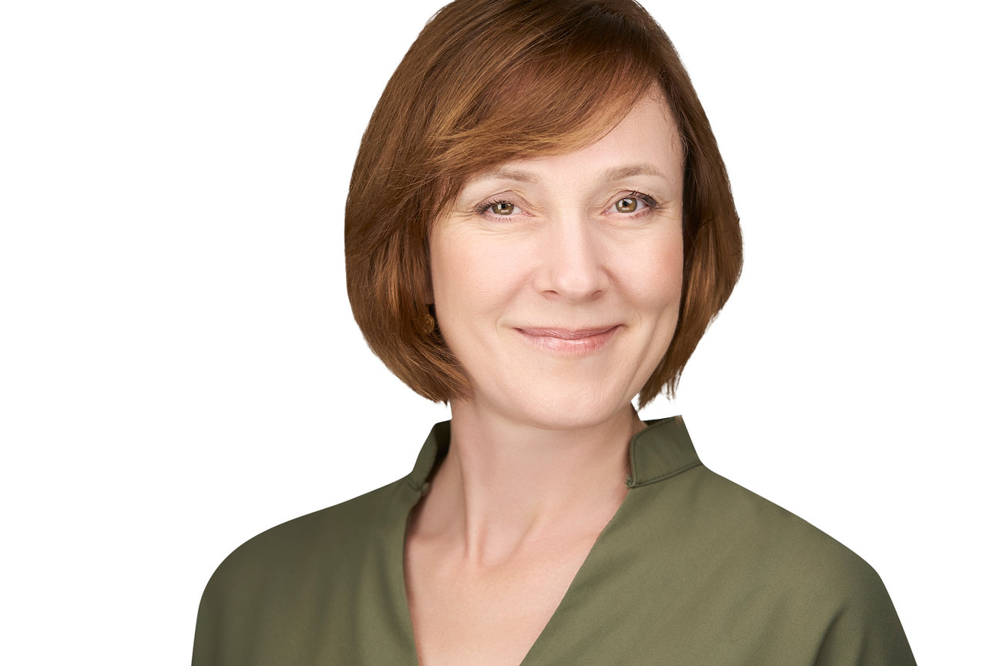

In [ ]:
from matplotlib import pyplot as plt
import numpy as np
import argparse
import cv2
# construct the argument parser and parse the arguments
from google.colab.patches import cv2_imshow
# load the image and show it
image = cv2.imread("original face/girl_3.jpg")
source = cv2.imread("original face/girl15.jpg")
result = cv2.imread("cheek_final.jpg")
cv2_imshow(image)

In [ ]:
chans = cv2.split(source)

In [ ]:
target_left = cv2.cvtColor(target_left_cheek_EXT_ARRAY, cv2.COLOR_BGR2GRAY)

In [ ]:
source_left = cv2.cvtColor(source_left_cheek_EXT_ARRAY, cv2.COLOR_BGR2GRAY)

(0.0, 256.0)

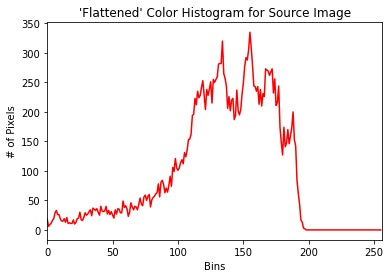

In [ ]:
plt.figure()
plt.title("'Flattened' Color Histogram for Source Image")
plt.xlabel("Bins")
plt.ylabel("# of Pixels")
features = []
chans = cv2.split(source)
hist = cv2.calcHist(chans, [0], source_left, [256], [0, 256])
plt.plot(hist, color = "r")
plt.xlim([0, 256])

(0.0, 256.0)

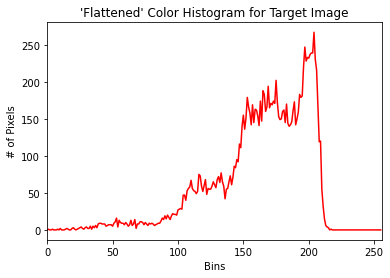

In [ ]:
plt.figure()
plt.title("'Flattened' Color Histogram for Target Image")
plt.xlabel("Bins")
plt.ylabel("# of Pixels")
features = []
chans = cv2.split(image)
hist = cv2.calcHist(chans, [0], target_left, [256], [0, 256])
plt.plot(hist, color = "r")
plt.xlim([0, 256])

(0.0, 256.0)

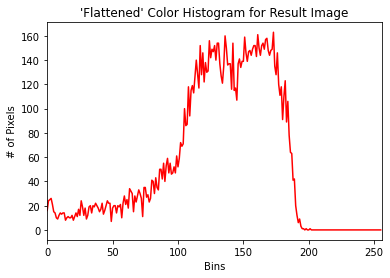

In [ ]:
plt.figure()
plt.title("'Flattened' Color Histogram for Result Image")
plt.xlabel("Bins")
plt.ylabel("# of Pixels")
features = []
chans = cv2.split(result)
hist = cv2.calcHist(chans, [0], target_left, [256], [1, 256])
plt.plot(hist, color = "r")
plt.xlim([0, 256])

(0.0, 256.0)

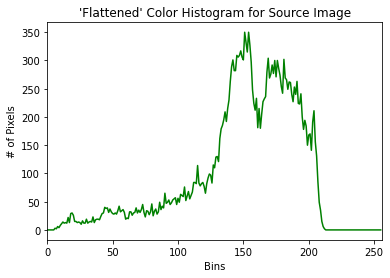

In [ ]:
plt.figure()
plt.title("'Flattened' Color Histogram for Source Image")
plt.xlabel("Bins")
plt.ylabel("# of Pixels")
features = []
chans = cv2.split(source)
hist = cv2.calcHist(chans, [1], source_left, [256], [1, 256])
plt.plot(hist, color = "g")
plt.xlim([0, 256])

(0.0, 256.0)

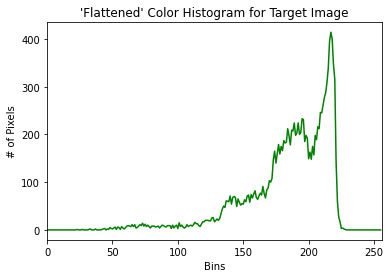

In [ ]:
plt.figure()
plt.title("'Flattened' Color Histogram for Target Image")
plt.xlabel("Bins")
plt.ylabel("# of Pixels")
features = []
chans = cv2.split(image)
hist = cv2.calcHist(chans, [1], target_left, [256], [1, 256])
plt.plot(hist, color = "g")
plt.xlim([0, 256])

(0.0, 256.0)

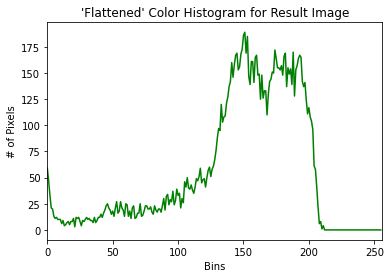

In [ ]:
plt.figure()
plt.title("'Flattened' Color Histogram for Result Image")
plt.xlabel("Bins")
plt.ylabel("# of Pixels")
features = []
chans = cv2.split(result)
hist = cv2.calcHist(chans, [1], target_left, [256], [1, 256])
plt.plot(hist, color = "g")
plt.xlim([0, 256])

(0.0, 256.0)

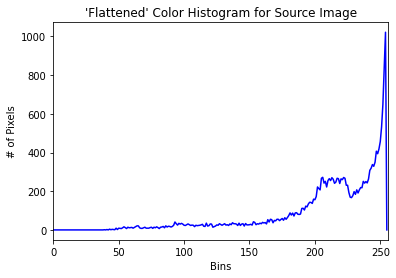

In [ ]:
plt.figure()
plt.title("'Flattened' Color Histogram for Source Image")
plt.xlabel("Bins")
plt.ylabel("# of Pixels")
features = []
chans = cv2.split(source)
hist = cv2.calcHist(chans, [2], source_left, [256], [0, 255])
plt.plot(hist, color = "b")
plt.xlim([0, 256])

(0.0, 256.0)

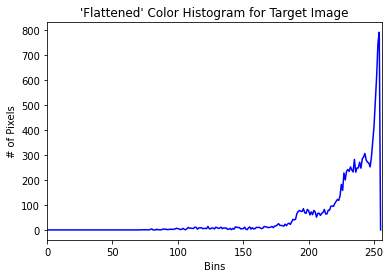

In [ ]:
plt.figure()
plt.title("'Flattened' Color Histogram for Target Image")
plt.xlabel("Bins")
plt.ylabel("# of Pixels")
features = []
chans = cv2.split(image)
hist = cv2.calcHist(chans, [2], target_left, [256], [0, 255])
plt.plot(hist, color = "b")
plt.xlim([0, 256])

(0.0, 256.0)

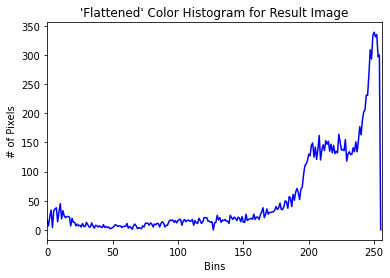

In [ ]:
plt.figure()
plt.title("'Flattened' Color Histogram for Result Image")
plt.xlabel("Bins")
plt.ylabel("# of Pixels")
features = []
chans = cv2.split(result)
hist = cv2.calcHist(chans, [2], target_left, [256], [1, 255])
plt.plot(hist, color = "b")
plt.xlim([0, 256])

## Segment out makeup


In [ ]:
os.path.dirname("face_makeup_PyTorch/test.py")

'face_makeup_PyTorch'

In [3]:
import os
os.chdir("face_makeup_PyTorch")

In [4]:
import torch
import os
from model import BiSeNet
import os.path as osp
import numpy as np
from PIL import Image
import torchvision.transforms as transforms
import cv2


def vis_parsing_maps(im, parsing_anno, stride, save_im=False, save_path='vis_results/parsing_map_on_im.jpg'):
    # Colors for all 20 parts
    part_colors = [[255, 0, 0], [255, 85, 0], [255, 170, 0],
                   [255, 0, 85], [255, 0, 170],
                   [0, 255, 0], [85, 255, 0], [170, 255, 0],
                   [0, 255, 85], [0, 255, 170],
                   [0, 0, 255], [85, 0, 255], [170, 0, 255],
                   [0, 85, 255], [0, 170, 255],
                   [255, 255, 0], [255, 255, 85], [255, 255, 170],
                   [255, 0, 255], [255, 85, 255], [255, 170, 255],
                   [0, 255, 255], [85, 255, 255], [170, 255, 255]]

    im = np.array(im)
    vis_im = im.copy().astype(np.uint8)
    vis_parsing_anno = parsing_anno.copy().astype(np.uint8)
    vis_parsing_anno = cv2.resize(vis_parsing_anno, None, fx=stride, fy=stride, interpolation=cv2.INTER_NEAREST)
    vis_parsing_anno_color = np.zeros((vis_parsing_anno.shape[0], vis_parsing_anno.shape[1], 3)) + 255

    num_of_class = np.max(vis_parsing_anno)

    for pi in range(1, num_of_class + 1):
        index = np.where(vis_parsing_anno == pi)
        vis_parsing_anno_color[index[0], index[1], :] = part_colors[pi]

    vis_parsing_anno_color = vis_parsing_anno_color.astype(np.uint8)
    # print(vis_parsing_anno_color.shape, vis_im.shape)
    vis_im = cv2.addWeighted(cv2.cvtColor(vis_im, cv2.COLOR_RGB2BGR), 0.4, vis_parsing_anno_color, 0.6, 0)

    # Save result or not
    if save_im:
        cv2.imwrite(save_path[:-4] +'.png', vis_parsing_anno)
        cv2.imwrite(save_path, vis_im, [int(cv2.IMWRITE_JPEG_QUALITY), 100])
    return vis_parsing_anno
    # return vis_im


def evaluate(image_path='./imgs/116.jpg', cp='cp/79999_iter.pth'):

    # if not os.path.exists(respth):
    #     os.makedirs(respth)

    n_classes = 19
    net = BiSeNet(n_classes=n_classes)
    net.cuda()
    net.load_state_dict(torch.load(cp))
    net.eval()

    to_tensor = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225)),
    ])

    with torch.no_grad():
        img = Image.open(image_path).convert('RGB')
        #image = img.resize((512, 512), Image.BILINEAR)
        image = img
        img = to_tensor(image)
        img = torch.unsqueeze(img, 0)
        img = img.cuda()
        out = net(img)[0]
        parsing = out.squeeze(0).cpu().numpy().argmax(0)
        # print(parsing)
        # print(np.unique(parsing))

        # vis_parsing_maps(image, parsing, stride=1, save_im=False, save_path=osp.join(respth, dspth))
        return parsing

In [5]:
import cv2
import os
import numpy as np
from skimage.filters import gaussian
#from test import evaluate
import argparse
from google.colab.patches import cv2_imshow

def sharpen(img):
    img = img * 1.0
    gauss_out = gaussian(img, sigma=5, multichannel=True)

    alpha = 1.5
    img_out = (img - gauss_out) * alpha + img

    img_out = img_out / 255.0

    mask_1 = img_out < 0
    mask_2 = img_out > 1

    img_out = img_out * (1 - mask_1)
    img_out = img_out * (1 - mask_2) + mask_2
    img_out = np.clip(img_out, 0, 1)
    img_out = img_out * 255
    return np.array(img_out, dtype=np.uint8)


def hair(image, parsing, part=17, color=[230, 50, 20]):
    b, g, r = color      #[10, 50, 250]       # [10, 250, 10]
    tar_color = np.zeros_like(image)
    tar_color[:, :, 0] = b
    tar_color[:, :, 1] = g
    tar_color[:, :, 2] = r

    image_hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    tar_hsv = cv2.cvtColor(tar_color, cv2.COLOR_BGR2HSV)

    if part == 12 or part == 13:
        image_hsv[:, :, 0:2] = tar_hsv[:, :, 0:2]
    else:
        image_hsv[:, :, 0:1] = tar_hsv[:, :, 0:1]

    changed = cv2.cvtColor(image_hsv, cv2.COLOR_HSV2BGR)

    if part == 17:
        changed = sharpen(changed)

    changed[parsing != part] = image[parsing != part]
    return changed


In [ ]:
os.listdir("..")

['t1.jpg',
 'facetools',
 'face-parsing.PyTorch',
 'colour_transfer',
 '=2.0.1',
 'fcn_pytorch.ipynb',
 'segmented face',
 'original face',
 'face_makeup_PyTorch',
 'result',
 'FYP Interim Report.gdoc',
 'girl15.csv',
 'out.png',
 'girl21.csv',
 'girl_3.csv',
 'girl.csv',
 'source',
 'target',
 'result_one_dimensional',
 'result_N_dimensional',
 'FYP REPORT',
 'report',
 'Final Colour Transfer.ipynb',
 'output2.png',
 'result_lips',
 'original face OpenFace',
 'result_eyebrows',
 'result_eyes',
 'results_skin',
 'result_face',
 'chapter4.drawio',
 'Untitled Diagram.drawio',
 'Hair Color Transfer Unsegmented.ipynb',
 'cheek_final.jpg',
 'girl_3.jpg',
 'Full.ipynb',
 'Submission',
 'Lips Color Transfer Unsegmented.ipynb']

## SKIN SOURCE

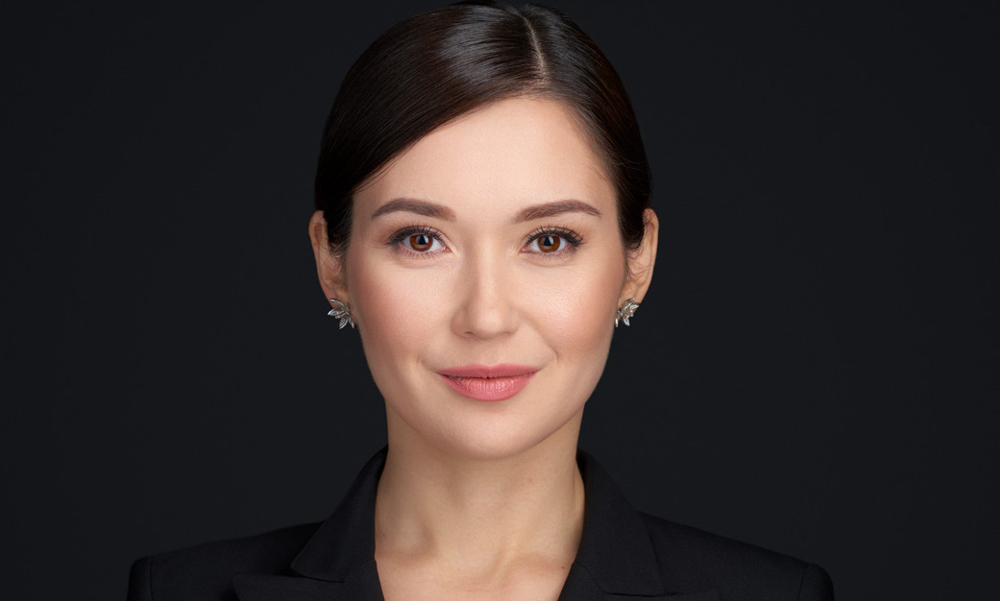

In [ ]:
from PIL import Image
# 1  face
# 11 teeth
# 12 upper lip
# 13 lower lip
# 17 hair


table = {
    'hair': 17,
    'upper_lip': 12,
    'lower_lip': 13
}


cp = 'cp/79999_iter.pth'

# image = cv2.imread(image_path)

# #image=data
# image_path="../segmented face/segmentedgirl5.png"
image_path="../original face/image/26_.jpg"

image = Image.open(image_path)
# convert image to numpy array
og_image = np.array(image)
image

Downloading: "https://download.pytorch.org/models/resnet18-5c106cde.pth" to /root/.cache/torch/hub/checkpoints/resnet18-5c106cde.pth



[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


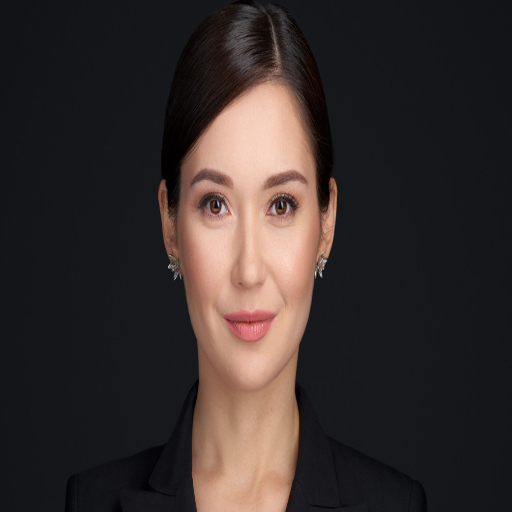

In [ ]:


ori = og_image.copy()
parsing = evaluate(image_path, cp)

print(parsing)
colors = [[230, 50, 20], [20, 70, 180], [20, 70, 180]]
cv2_imshow(cv2.resize(cv2.cvtColor(og_image, cv2.COLOR_BGR2RGB), (512, 512)))

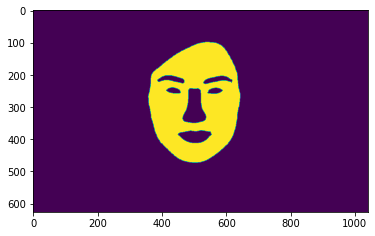

In [ ]:
import matplotlib.pyplot as plt
plt.imshow(parsing==1)

In [ ]:
skin_source = og_image

In [ ]:
skin_source = np.zeros((og_image.shape[0],og_image.shape[1],4))

In [ ]:
#parsing[x][y]==3
#parsing[x][y]==3 or parsing[x][y]==2
for x in range((skin_source.shape[0])):
  for y in range((skin_source.shape[1])):
    if  (parsing[x][y]==1 or parsing[x][y]==10 or parsing[x][y]==14or parsing[x][y]==7): # or parsing[x][y]==10):
      skin_source[x][y][0]=og_image[x][y][0]
      skin_source[x][y][1]=og_image[x][y][1]
      skin_source[x][y][2]=og_image[x][y][2]
      skin_source[x][y][3]=255
    else:
      skin_source[x][y][3]=0
      skin_source[x][y][0]=0
      skin_source[x][y][1]=0
      skin_source[x][y][2]=0

In [ ]:
skin_source

array([[[0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        ...,
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.]],

       [[0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        ...,
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.]],

       [[0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        ...,
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.]],

       ...,

       [[0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        ...,
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.]],

       [[0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        ...,
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.]],

       [[0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        ...,
        [0., 0., 0., 0.],
        [0., 0.

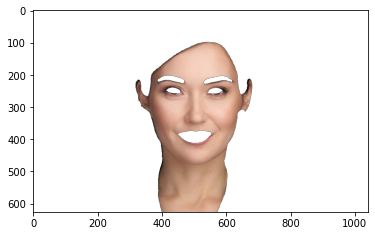

In [ ]:
plt.imshow(skin_source/255)

In [ ]:
# lip_source = lip_source.astype('float32')

In [ ]:
# cv2_imshow(cv2.cvtColor(eyebrow_source.astype('float32'), cv2.COLOR_BGR2RGB))

## SKIN TARGET

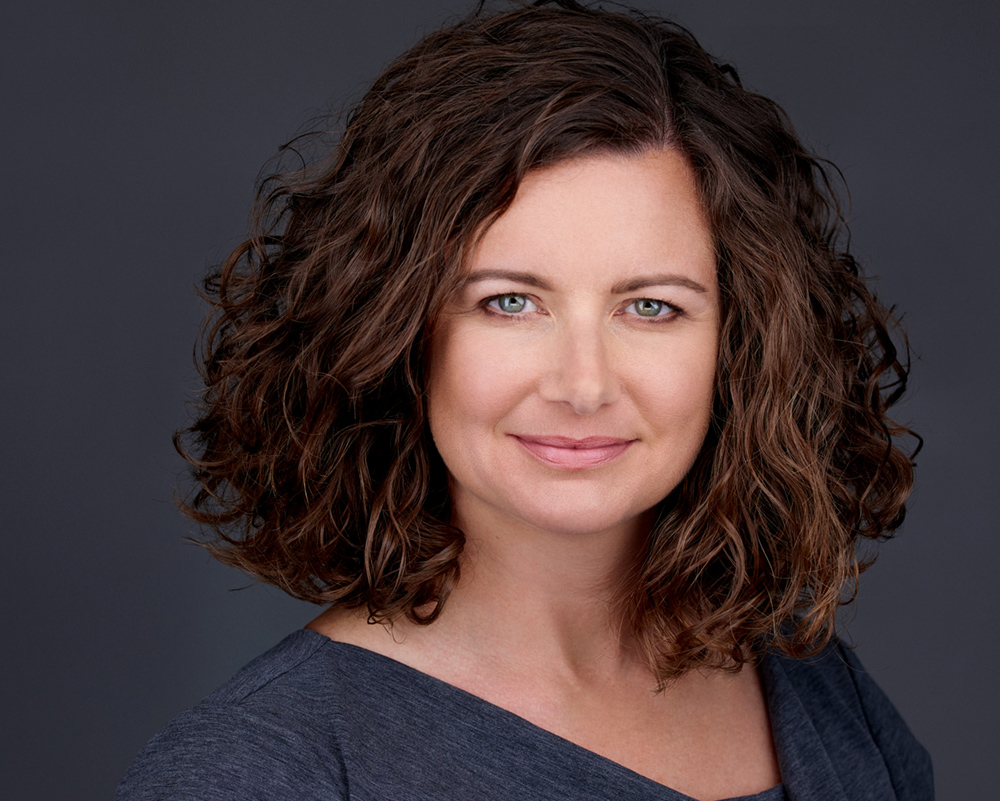

In [6]:
from PIL import Image
# 1  face
# 11 teeth
# 12 upper lip
# 13 lower lip
# 17 hair


table = {
    'hair': 17,
    'upper_lip': 12,
    'lower_lip': 13
}


cp = 'cp/79999_iter.pth'

# image = cv2.imread(image_path)

# #image=data
image_path="../original face/image/40.jpg"
image = Image.open(image_path)
# convert image to numpy array
og_image = np.array(image)
image

Downloading: "https://download.pytorch.org/models/resnet18-5c106cde.pth" to /root/.cache/torch/hub/checkpoints/resnet18-5c106cde.pth



[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


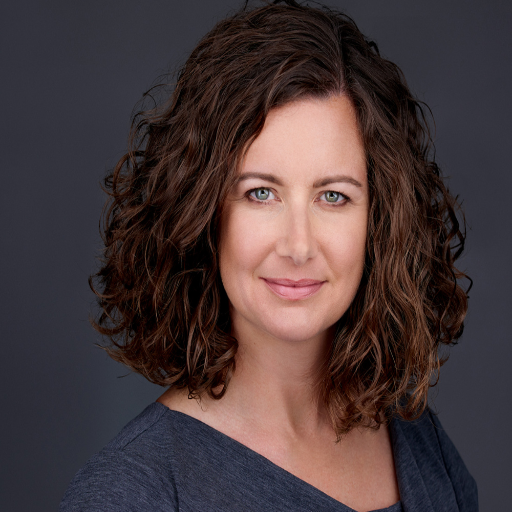

In [7]:
ori = og_image.copy()
parsing = evaluate(image_path, cp)

print(parsing)
colors = [[230, 50, 20], [20, 70, 180], [20, 70, 180]]

cv2_imshow(cv2.resize(cv2.cvtColor(og_image, cv2.COLOR_BGR2RGB), (512, 512)))

In [8]:
skin_target = og_image

In [9]:
skin_target = np.zeros((og_image.shape[0],og_image.shape[1],4))

In [10]:
og_image.shape

(801, 1000, 3)

In [11]:
skin_target.shape

(801, 1000, 4)

In [12]:
parsing.shape

(801, 1000)

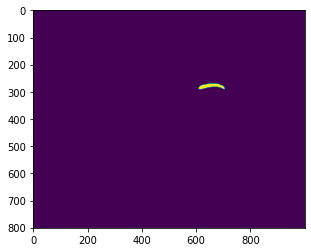

In [13]:
import matplotlib.pyplot as plt
plt.imshow(parsing==2)

In [14]:
for x in range(len(parsing)):
  for y in range(len(parsing[0])):
    if (parsing[x][y]==1 or parsing[x][y]==10 or parsing[x][y]==14or parsing[x][y]==7):
      skin_target[x][y][0]=og_image[x][y][0]
      skin_target[x][y][1]=og_image[x][y][1]
      skin_target[x][y][2]=og_image[x][y][2]
      skin_target[x][y][3]=255
    else:
      skin_target[x][y][3]=0
      skin_target[x][y][0]=0
      skin_target[x][y][1]=0
      skin_target[x][y][2]=0

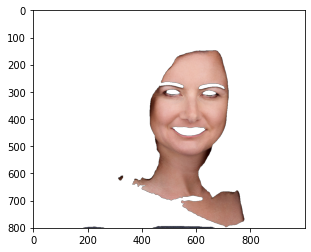

In [15]:
plt.imshow(skin_target/255)

## SKIN RESULT

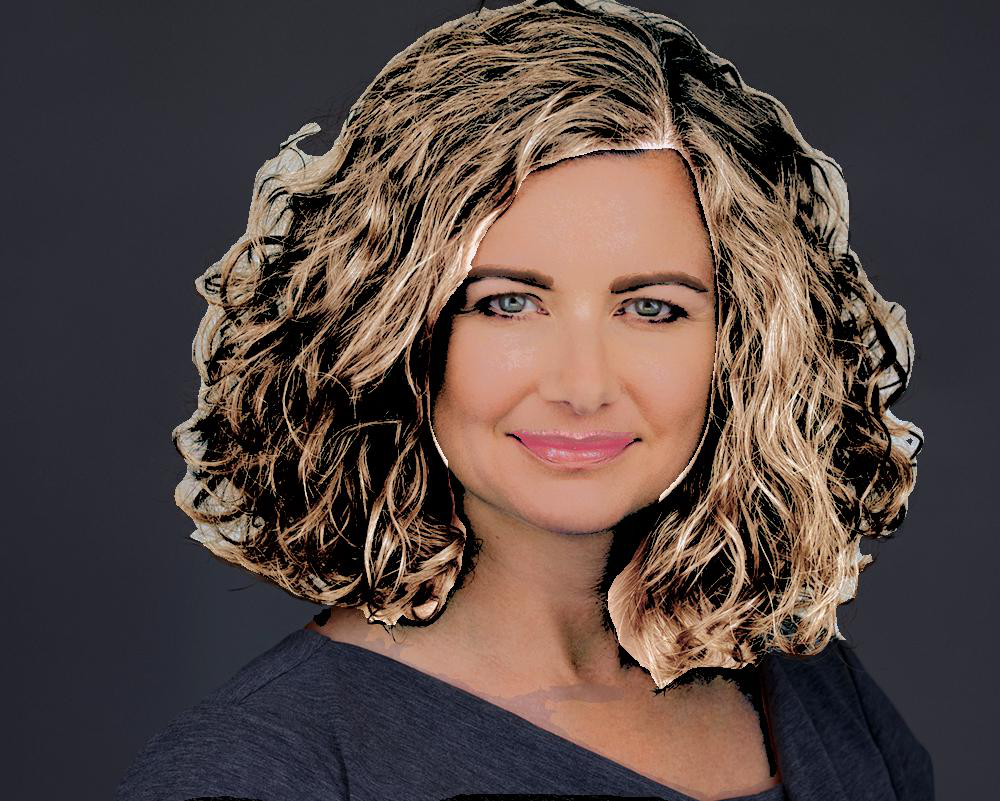

In [25]:
from PIL import Image
# 1  face
# 11 teeth
# 12 upper lip
# 13 lower lip
# 17 hair


table = {
    'hair': 17,
    'upper_lip': 12,
    'lower_lip': 13
}


cp = 'cp/79999_iter.pth'

# image = cv2.imread(image_path)

# #image=data
# image_path="../segmented face/segmentedgirl5.png"
image_path="../result_face/girl19_40/girl19_40_result.jpg"

image = Image.open(image_path)
# convert image to numpy array
og_image = np.array(image)
image

In [26]:
skin_result = np.zeros((og_image.shape[0],og_image.shape[1],4))

In [27]:
#parsing[x][y]==3
#parsing[x][y]==3 or parsing[x][y]==2
for x in range((skin_result.shape[0])):
  for y in range((skin_result.shape[1])):
    if (parsing[x][y]==17):# or parsing[x][y]==10 or parsing[x][y]==14 or parsing[x][y]==7): #(parsing[x][y]==1 or parsing[x][y]==10 or parsing[x][y]==14 or parsing[x][y]==7):
      skin_result[x][y][0]=og_image[x][y][0]
      skin_result[x][y][1]=og_image[x][y][1]
      skin_result[x][y][2]=og_image[x][y][2]
      skin_result[x][y][3]=255
    else:
      skin_result[x][y][3]=0
      skin_result[x][y][0]=0
      skin_result[x][y][1]=0
      skin_result[x][y][2]=0

In [19]:
skin_result

array([[[0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        ...,
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.]],

       [[0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        ...,
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.]],

       [[0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        ...,
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.]],

       ...,

       [[0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        ...,
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.]],

       [[0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        ...,
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.]],

       [[0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        ...,
        [0., 0., 0., 0.],
        [0., 0.

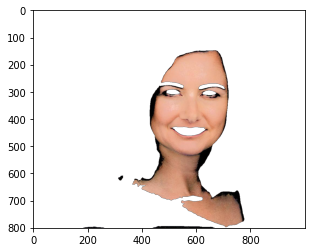

In [20]:
plt.imshow(skin_result/255)

In [ ]:
# lip_source = lip_source.astype('float32')

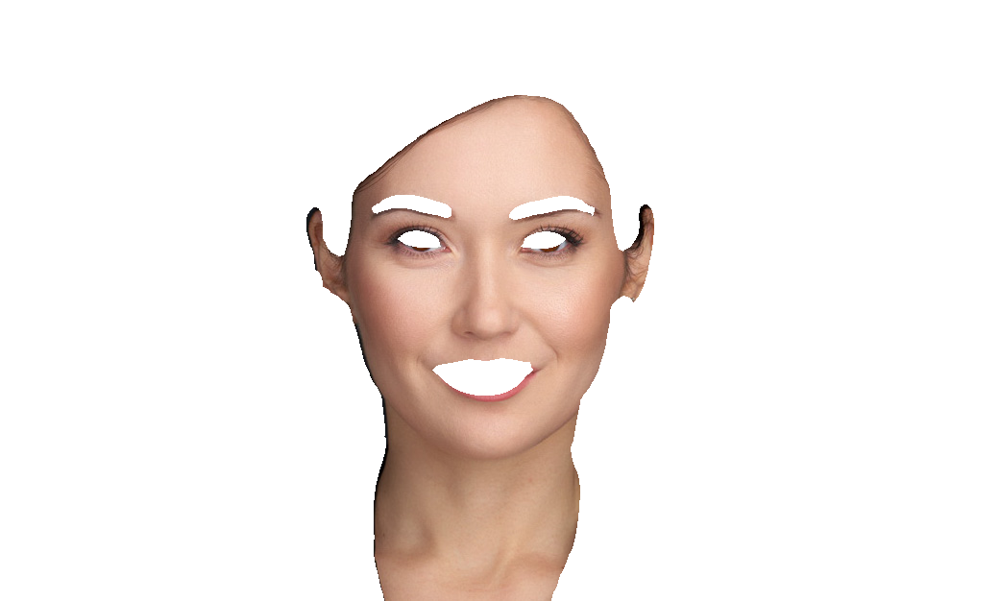

In [ ]:
Image.fromarray(skin_source.astype('uint8'))

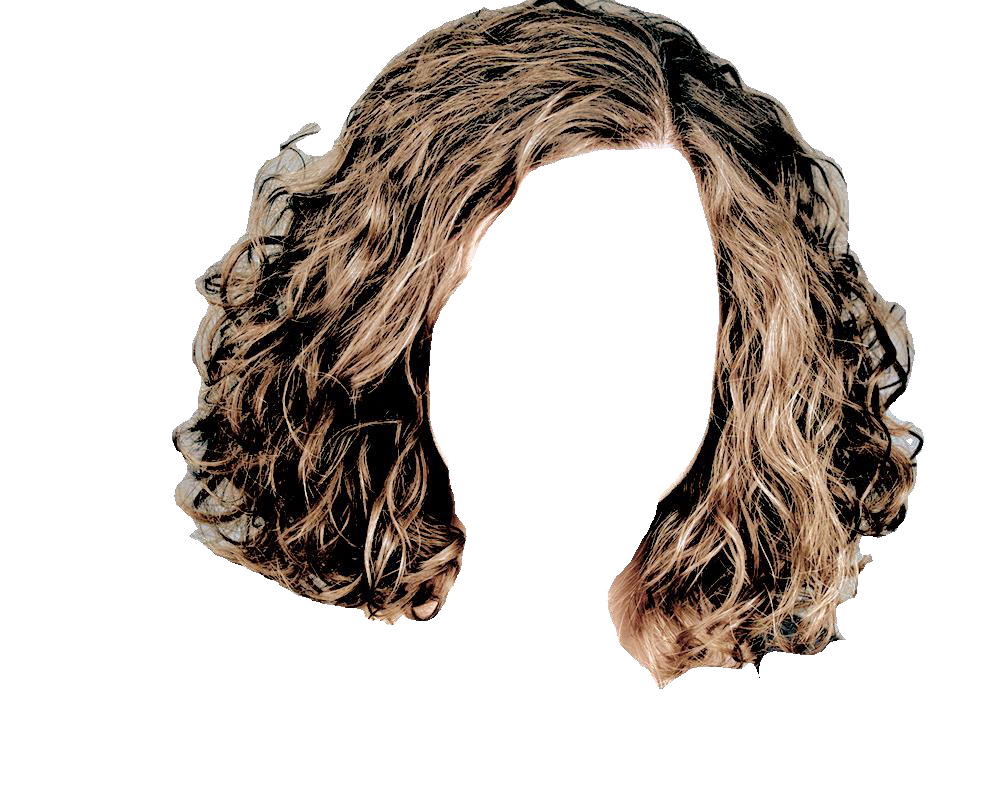

In [28]:
Image.fromarray(skin_result.astype('uint8'))

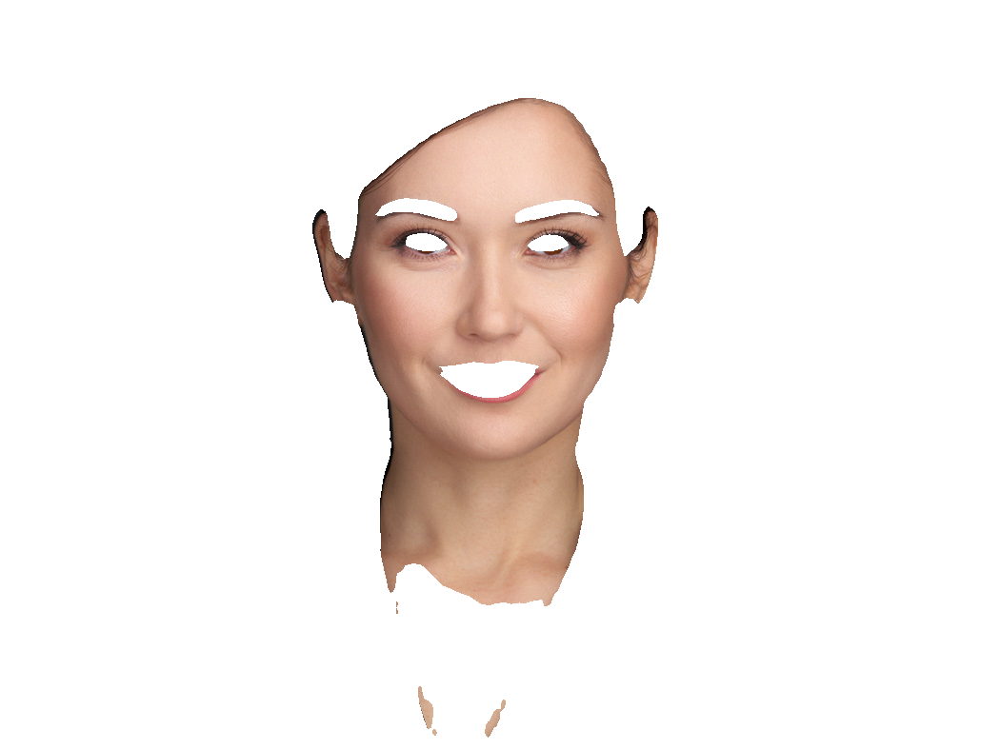

In [ ]:
Image.fromarray(skin_target.astype('uint8'))

## Figure 47

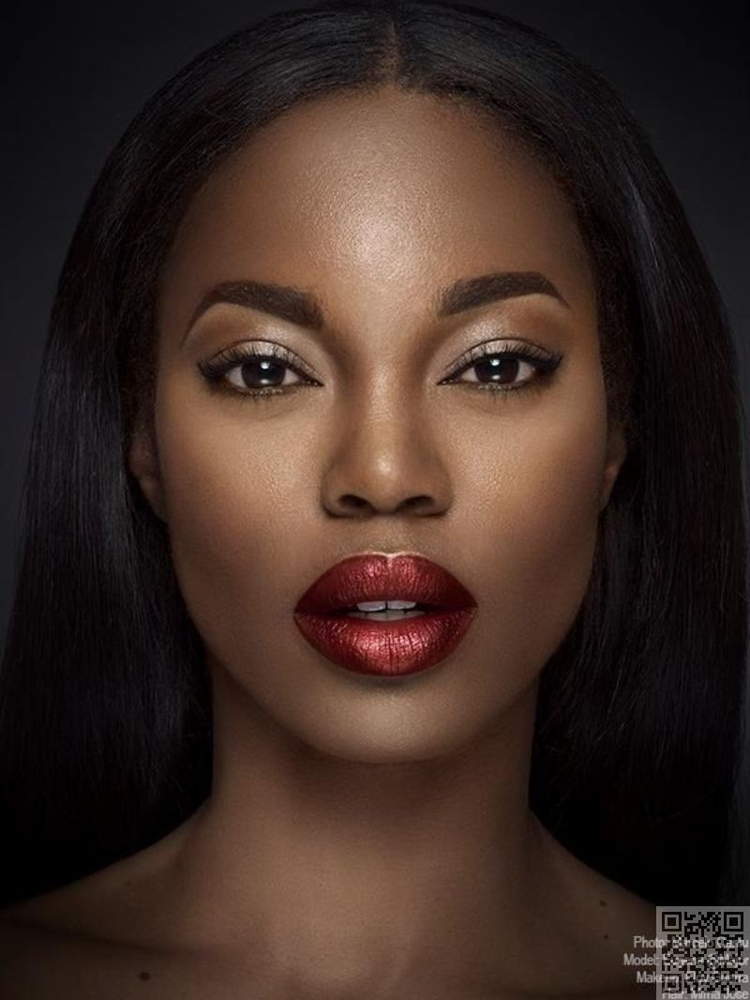

In [ ]:
from matplotlib import pyplot as plt
import numpy as np
import argparse
import cv2
# construct the argument parser and parse the arguments
from google.colab.patches import cv2_imshow
# load the image and show it
source = cv2.imread("../original face/image/4.jpg")
image = cv2.imread("../original face/image/27.jpg")
result = cv2.imread("../result_face/4_27/4_27_result_eyebrows.jpg")
cv2_imshow(source)

In [ ]:
skin_source.astype

<function ndarray.astype>

In [ ]:
skin_source.shape

(1066, 800, 4)

In [ ]:
skin_source_ = cv2.cvtColor(skin_source.astype('uint8'), cv2.COLOR_BGR2GRAY)

In [ ]:
skin_target_ = cv2.cvtColor(skin_target.astype('uint8'), cv2.COLOR_BGR2GRAY)

(0.0, 256.0)

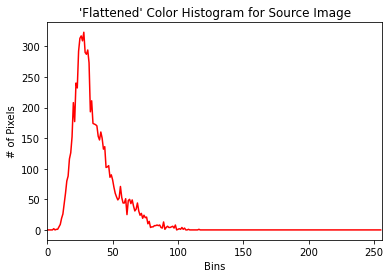

In [ ]:
plt.figure()
plt.title("'Flattened' Color Histogram for Source Image")
plt.xlabel("Bins")
plt.ylabel("# of Pixels")
features = []
chans = cv2.split(source)
hist = cv2.calcHist(chans, [0], skin_source_, [256], [0, 256])
plt.plot(hist, color = "r")
plt.xlim([0, 256])

(0.0, 256.0)

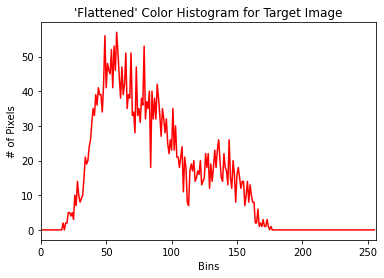

In [ ]:
plt.figure()
plt.title("'Flattened' Color Histogram for Target Image")
plt.xlabel("Bins")
plt.ylabel("# of Pixels")
features = []
chans = cv2.split(image)
hist = cv2.calcHist(chans, [0], skin_target_, [256], [0, 256])
plt.plot(hist, color = "r")
plt.xlim([0, 256])

(0.0, 256.0)

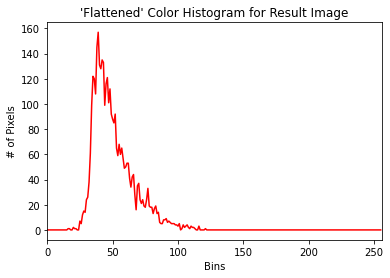

In [ ]:
plt.figure()
plt.title("'Flattened' Color Histogram for Result Image")
plt.xlabel("Bins")
plt.ylabel("# of Pixels")
features = []
chans = cv2.split(result)
hist = cv2.calcHist(chans, [0], skin_target_, [256], [0, 256])
plt.plot(hist, color = "r")
plt.xlim([0, 256])

(0.0, 256.0)

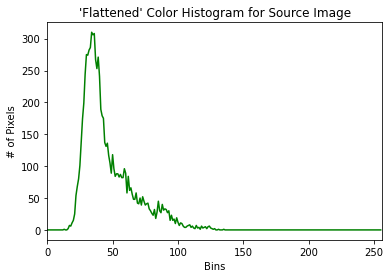

In [ ]:
plt.figure()
plt.title("'Flattened' Color Histogram for Source Image")
plt.xlabel("Bins")
plt.ylabel("# of Pixels")
features = []
chans = cv2.split(source)
hist = cv2.calcHist(chans, [1], skin_source_, [256], [0, 256])
plt.plot(hist, color = "g")
plt.xlim([0, 256])

(0.0, 256.0)

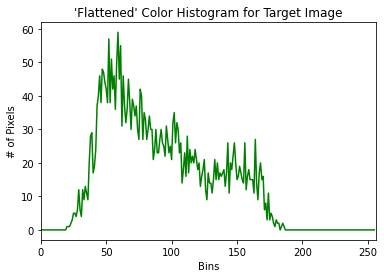

In [ ]:
plt.figure()
plt.title("'Flattened' Color Histogram for Target Image")
plt.xlabel("Bins")
plt.ylabel("# of Pixels")
features = []
chans = cv2.split(image)
hist = cv2.calcHist(chans, [1], skin_target_, [256], [0, 256])
plt.plot(hist, color = "g")
plt.xlim([0, 256])

(0.0, 256.0)

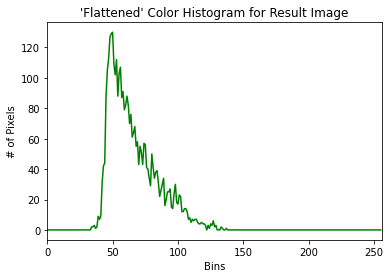

In [ ]:
plt.figure()
plt.title("'Flattened' Color Histogram for Result Image")
plt.xlabel("Bins")
plt.ylabel("# of Pixels")
features = []
chans = cv2.split(result)
hist = cv2.calcHist(chans, [1], skin_target_, [256], [0, 256])
plt.plot(hist, color = "g")
plt.xlim([0, 256])

(0.0, 256.0)

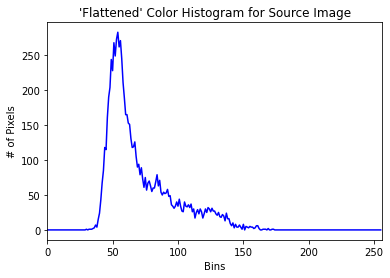

In [ ]:
plt.figure()
plt.title("'Flattened' Color Histogram for Source Image")
plt.xlabel("Bins")
plt.ylabel("# of Pixels")
features = []
chans = cv2.split(source)
hist = cv2.calcHist(chans, [2], skin_source_, [256], [0, 255])
plt.plot(hist, color = "b")
plt.xlim([0, 256])

(0.0, 256.0)

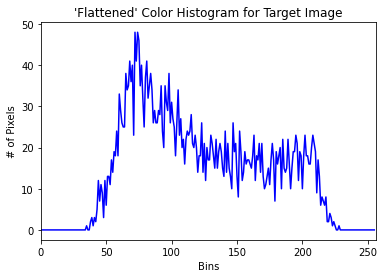

In [ ]:
plt.figure()
plt.title("'Flattened' Color Histogram for Target Image")
plt.xlabel("Bins")
plt.ylabel("# of Pixels")
features = []
chans = cv2.split(image)
hist = cv2.calcHist(chans, [2], skin_target_, [256], [0, 256])
plt.plot(hist, color = "b")
plt.xlim([0, 256])

(0.0, 256.0)

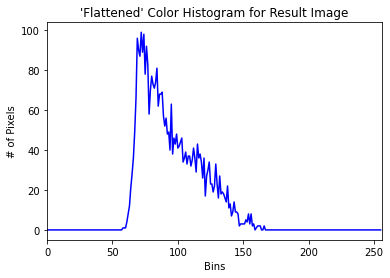

In [ ]:
plt.figure()
plt.title("'Flattened' Color Histogram for Result Image")
plt.xlabel("Bins")
plt.ylabel("# of Pixels")
features = []
chans = cv2.split(result)
hist = cv2.calcHist(chans, [2], skin_target_, [256], [0, 256])
plt.plot(hist, color = "b")
plt.xlim([0, 256])

## HAIR TARGET

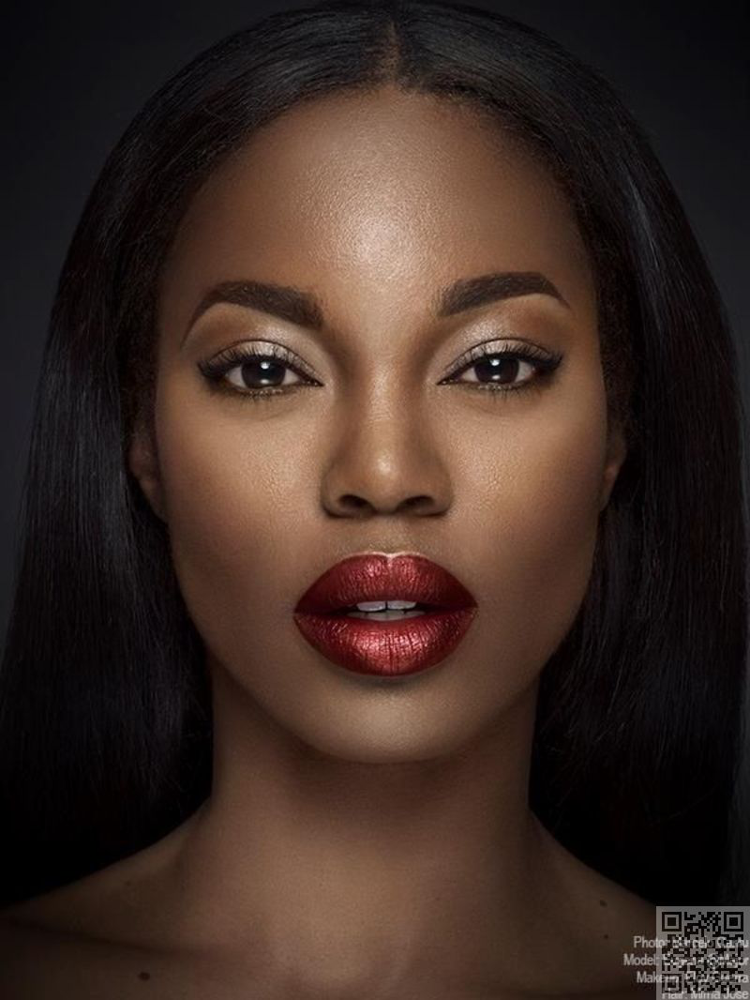

In [ ]:
from PIL import Image
# 1  face
# 11 teeth
# 12 upper lip
# 13 lower lip
# 17 hair


table = {
    'hair': 17,
    'upper_lip': 12,
    'lower_lip': 13
}


cp = 'cp/79999_iter.pth'

# image = cv2.imread(image_path)

# #image=data
image_path="../original face/image/4.jpg"
image = Image.open(image_path)
# convert image to numpy array
og_image = np.array(image)
image

--- 0.4172654151916504 seconds ---
[[ 0  0  0 ...  0  0  0]
 [ 0  0  0 ...  0  0  0]
 [ 0  0  0 ...  0  0  0]
 ...
 [ 0  0  0 ... 17 17 17]
 [ 0  0  0 ... 17 17 17]
 [ 0  0  0 ... 17 17 17]]


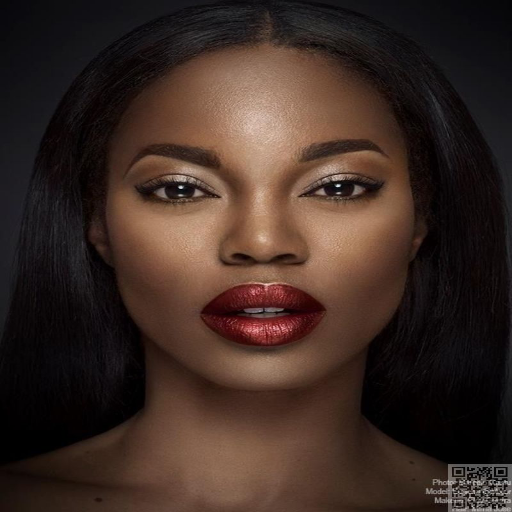

In [ ]:

import time
ori = og_image.copy()


start_time = time.time()
parsing = evaluate(image_path, cp)
print("--- %s seconds ---" % (time.time() - start_time))


print(parsing)
colors = [[230, 50, 20], [20, 70, 180], [20, 70, 180]]

cv2_imshow(cv2.resize(cv2.cvtColor(og_image, cv2.COLOR_BGR2RGB), (512, 512)))

In [ ]:
hair_target = og_image

In [ ]:
hair_target = np.zeros((og_image.shape[0],og_image.shape[1],4))

In [ ]:
og_image.shape

(1066, 800, 3)

In [ ]:
hair_target.shape

(1066, 800, 4)

In [ ]:
parsing.shape

(1066, 800)

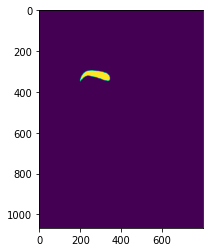

In [ ]:
import matplotlib.pyplot as plt
plt.imshow(parsing==3)

In [ ]:
for x in range(len(parsing)):
  for y in range(len(parsing[0])):
    if (parsing[x][y]==17):
      hair_target[x][y][0]=og_image[x][y][0]
      hair_target[x][y][1]=og_image[x][y][1]
      hair_target[x][y][2]=og_image[x][y][2]
      hair_target[x][y][3]=255
    else:
      hair_target[x][y][3]=0

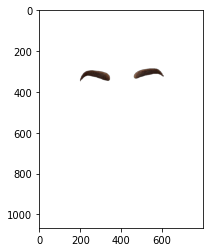

In [ ]:
plt.imshow(hair_target/255)

## HAIR SOURCE

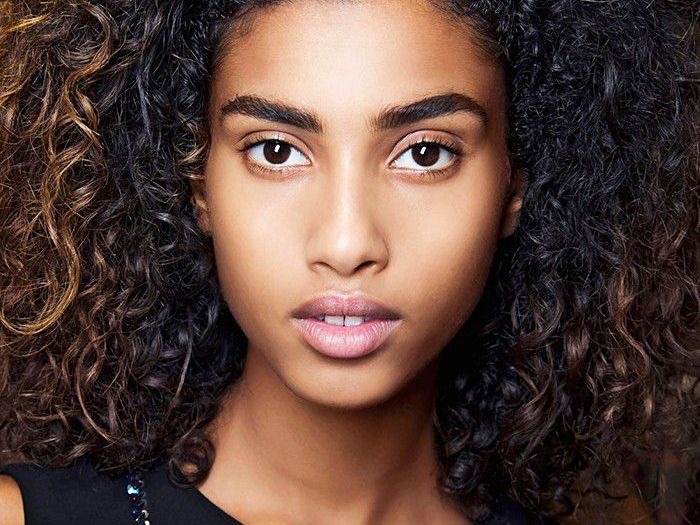

In [ ]:
from PIL import Image
# 1  face
# 11 teeth
# 12 upper lip
# 13 lower lip
# 17 hair


table = {
    'hair': 17,
    'upper_lip': 12,
    'lower_lip': 13
}


cp = 'cp/79999_iter.pth'

# image = cv2.imread(image_path)

# #image=data
# image_path="../segmented face/segmentedgirl5.png"
image_path="../original face/image/13.jpg"

image = Image.open(image_path)
# convert image to numpy array
og_image = np.array(image)
image

[[17 17 17 ... 17 17 17]
 [17 17 17 ... 17 17 17]
 [17 17 17 ... 17 17 17]
 ...
 [ 0  0  0 ... 17 17 17]
 [ 0  0  0 ... 17 17 17]
 [ 0  0  0 ... 17 17 17]]


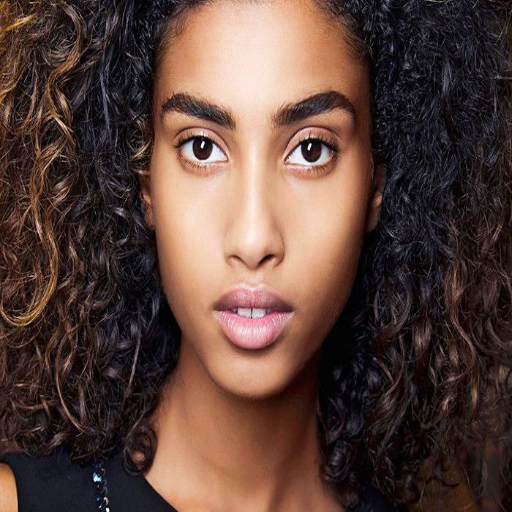

In [ ]:
ori = og_image.copy()
parsing = evaluate(image_path, cp)

print(parsing)
colors = [[230, 50, 20], [20, 70, 180], [20, 70, 180]]
cv2_imshow(cv2.resize(cv2.cvtColor(og_image, cv2.COLOR_BGR2RGB), (512, 512)))

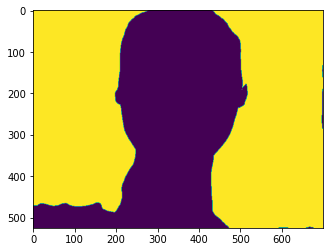

In [ ]:
plt.imshow(parsing==17)

In [ ]:
hair_source = og_image

In [ ]:
hair_source = np.zeros((og_image.shape[0],og_image.shape[1],4))

In [ ]:
for x in range((hair_source.shape[0])):
  for y in range((hair_source.shape[1])):
    if (parsing[x][y]==17):
      hair_source[x][y][0]=og_image[x][y][0]
      hair_source[x][y][1]=og_image[x][y][1]
      hair_source[x][y][2]=og_image[x][y][2]
      hair_source[x][y][3]=255
    else:
      hair_source[x][y][3]=0

In [ ]:
hair_source.shape

(525, 700, 4)

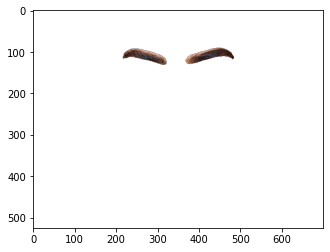

In [ ]:
plt.imshow(hair_source/255)

## HAIR RESULT

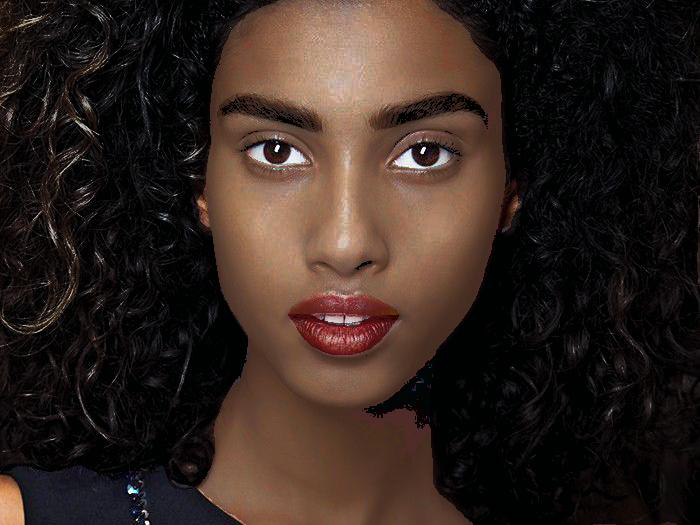

In [ ]:
from PIL import Image
# 1  face
# 11 teeth
# 12 upper lip
# 13 lower lip
# 17 hair


table = {
    'hair': 17,
    'upper_lip': 12,
    'lower_lip': 13
}


cp = 'cp/79999_iter.pth'

# image = cv2.imread(image_path)

# #image=data
image_path="../result_face/4_13/4_13_result.jpg"
image = Image.open(image_path)
# convert image to numpy array
og_image = np.array(image)
image

In [ ]:
hair_result = np.zeros((og_image.shape[0],og_image.shape[1],4))

In [ ]:
og_image.shape

(525, 700, 3)

In [ ]:
hair_result.shape

(525, 700, 4)

In [ ]:
parsing.shape

(525, 700)

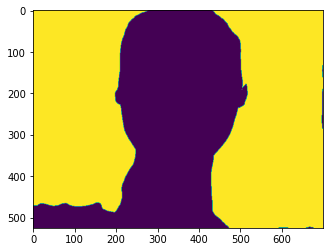

In [ ]:
import matplotlib.pyplot as plt
plt.imshow(parsing==17)

In [ ]:
for x in range(len(parsing)):
  for y in range(len(parsing[0])):
    if (parsing[x][y]==17):
      hair_result[x][y][0]=og_image[x][y][0]
      hair_result[x][y][1]=og_image[x][y][1]
      hair_result[x][y][2]=og_image[x][y][2]
      hair_result[x][y][3]=255
    else:
      hair_result[x][y][3]=0

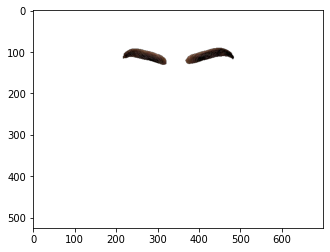

In [ ]:
plt.imshow(hair_result/255)

## Figure 35 36 HAIR

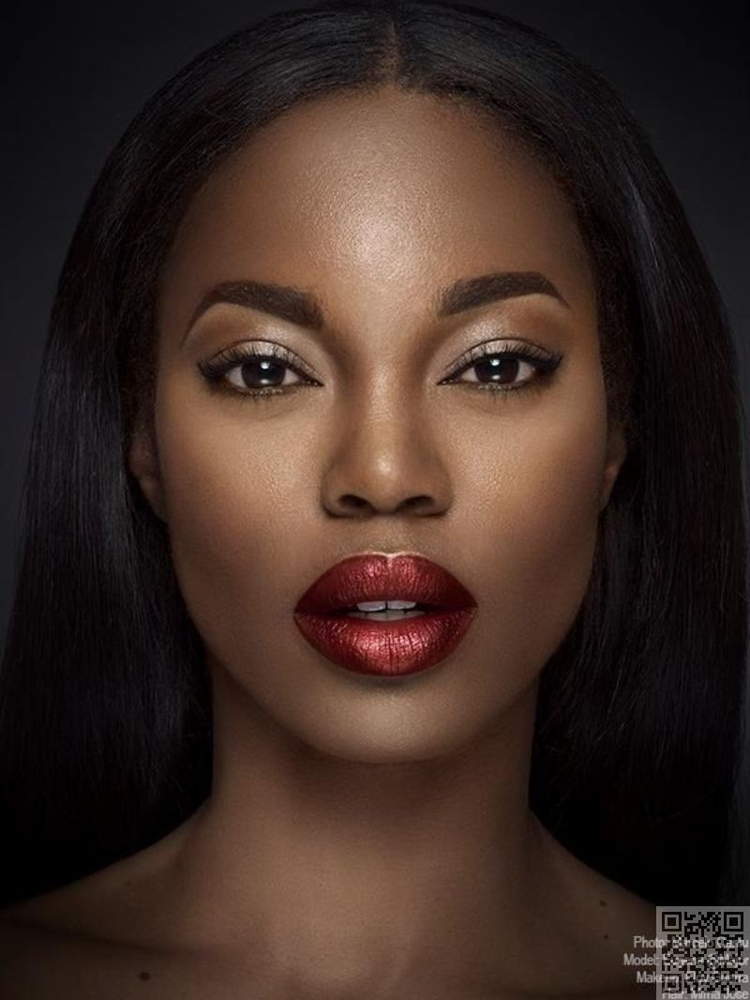

In [ ]:
from matplotlib import pyplot as plt
import numpy as np
import argparse
import cv2
# construct the argument parser and parse the arguments
from google.colab.patches import cv2_imshow
# load the image and show it
source = cv2.imread("../original face/image/4.jpg")
image = cv2.imread("../original face/image/13.jpg")
result = cv2.imread("../result_face/4_13/4_13_result_eyebrows.jpg")
cv2_imshow(source)

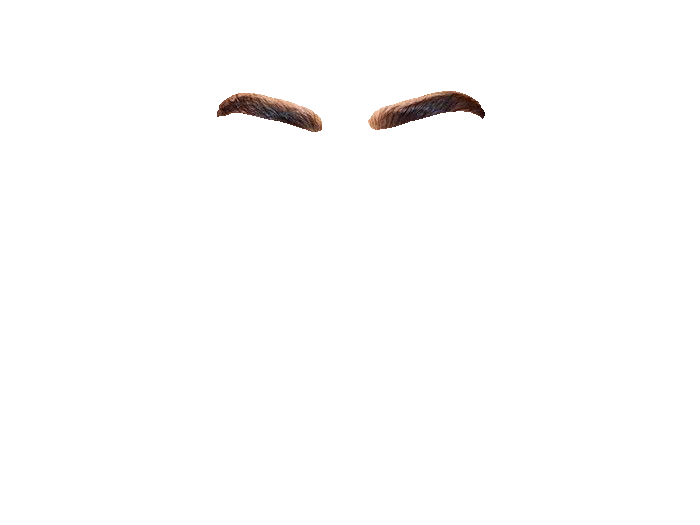

In [ ]:
Image.fromarray((hair_source).astype('uint8'))

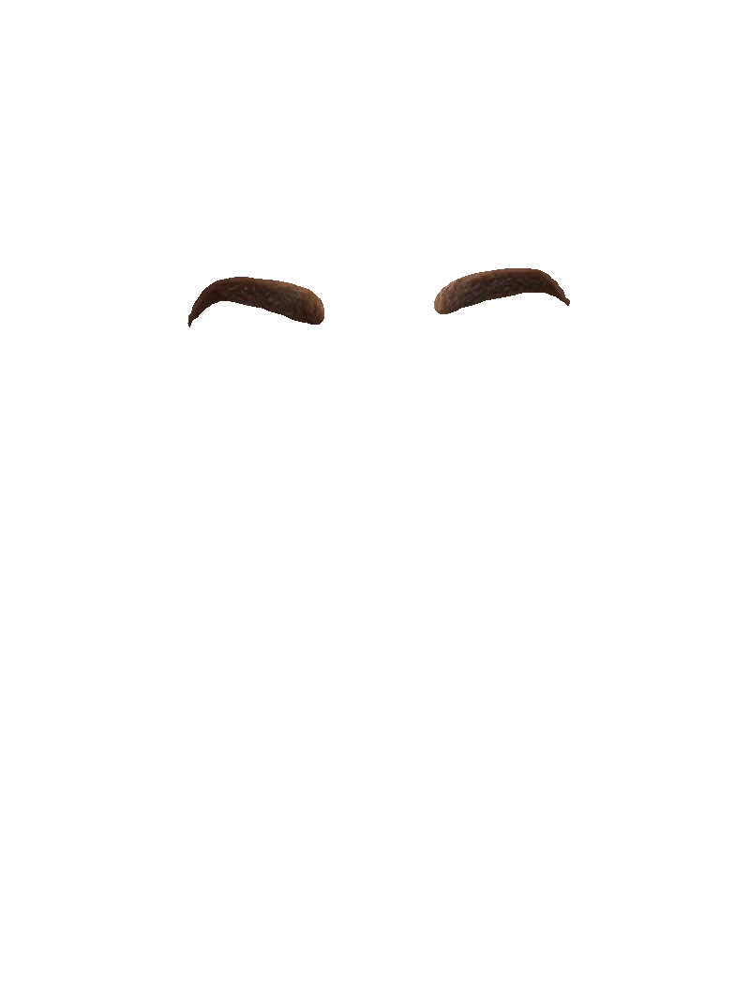

In [ ]:
Image.fromarray((hair_target).astype('uint8'))

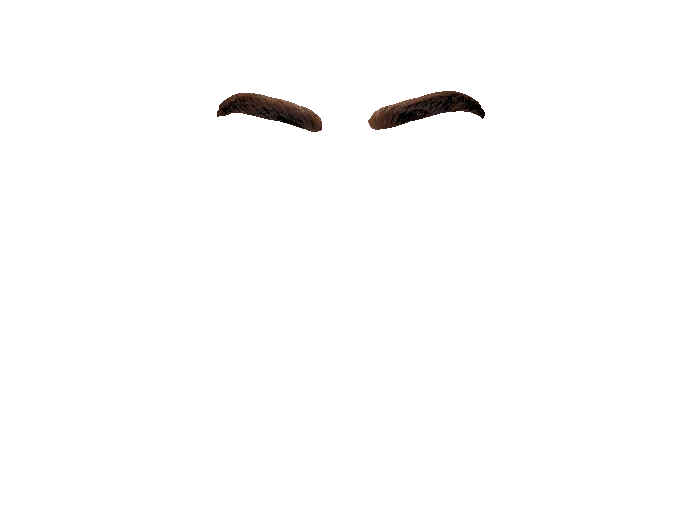

In [ ]:
Image.fromarray((hair_result).astype('uint8'))

In [ ]:
hair_source_ = cv2.cvtColor(hair_source.astype('uint8'), cv2.COLOR_BGR2GRAY)

In [ ]:
hair_target_ = cv2.cvtColor(hair_target.astype('uint8'), cv2.COLOR_BGR2GRAY)

In [ ]:
hair_result_ = cv2.cvtColor(hair_result.astype('uint8'), cv2.COLOR_BGR2GRAY)

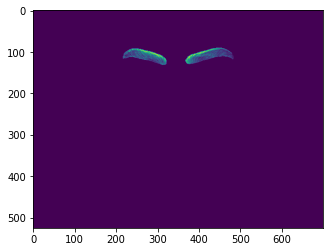

In [ ]:
plt.imshow(hair_source_)

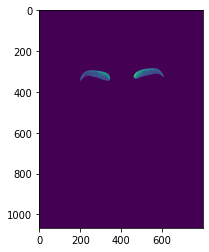

In [ ]:
plt.imshow(hair_target_)

(0.0, 256.0)

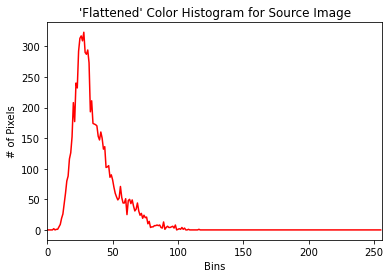

In [ ]:
plt.figure()
plt.title("'Flattened' Color Histogram for Source Image")
plt.xlabel("Bins")
plt.ylabel("# of Pixels")
features = []
chans = cv2.split(source)
hist = cv2.calcHist(chans, [0], hair_target_, [256], [0, 256])
plt.plot(hist, color = "r")
plt.xlim([0, 256])

(0.0, 256.0)

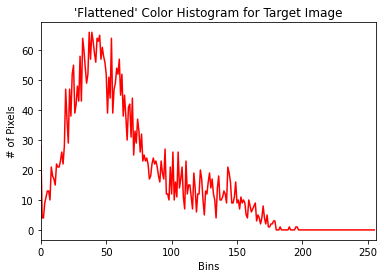

In [ ]:
plt.figure()
plt.title("'Flattened' Color Histogram for Target Image")
plt.xlabel("Bins")
plt.ylabel("# of Pixels")
features = []
chans = cv2.split(image)
hist = cv2.calcHist(chans, [0], hair_source_, [256], [0, 256])
plt.plot(hist, color = "r")
plt.xlim([0, 256])

(0.0, 256.0)

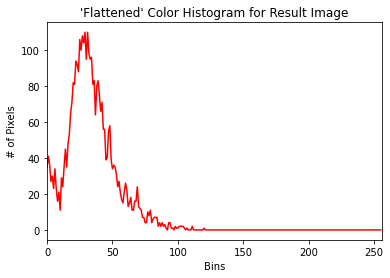

In [ ]:
plt.figure()
plt.title("'Flattened' Color Histogram for Result Image")
plt.xlabel("Bins")
plt.ylabel("# of Pixels")
features = []
chans = cv2.split(result)
hist = cv2.calcHist(chans, [0], hair_result_, [256], [1, 256])
plt.plot(hist, color = "r")
plt.xlim([0, 256])

(0.0, 256.0)

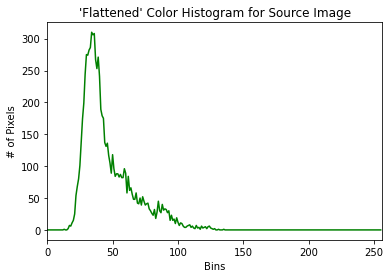

In [ ]:
plt.figure()
plt.title("'Flattened' Color Histogram for Source Image")
plt.xlabel("Bins")
plt.ylabel("# of Pixels")
features = []
chans = cv2.split(source)
hist = cv2.calcHist(chans, [1], hair_target_, [256], [0, 256])
plt.plot(hist, color = "g")
plt.xlim([0, 256])

(0.0, 256.0)

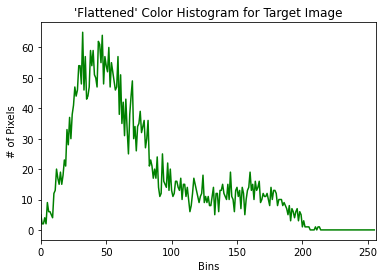

In [ ]:
plt.figure()
plt.title("'Flattened' Color Histogram for Target Image")
plt.xlabel("Bins")
plt.ylabel("# of Pixels")
features = []
chans = cv2.split(image)
hist = cv2.calcHist(chans, [1], hair_source_, [256], [0, 256])
plt.plot(hist, color = "g")
plt.xlim([0, 256])

(0.0, 256.0)

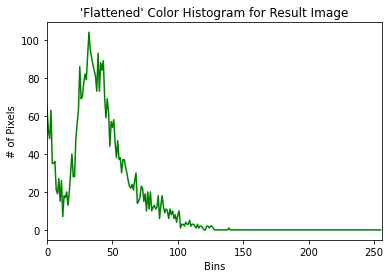

In [ ]:
plt.figure()
plt.title("'Flattened' Color Histogram for Result Image")
plt.xlabel("Bins")
plt.ylabel("# of Pixels")
features = []
chans = cv2.split(result)
hist = cv2.calcHist(chans, [1], hair_result_, [256], [1, 256])
plt.plot(hist, color = "g")
plt.xlim([0, 256])

(0.0, 256.0)

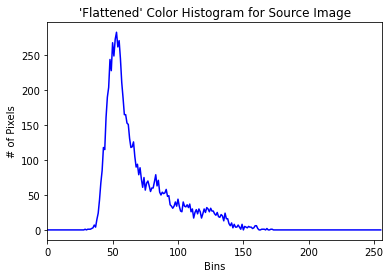

In [ ]:
plt.figure()
plt.title("'Flattened' Color Histogram for Source Image")
plt.xlabel("Bins")
plt.ylabel("# of Pixels")
features = []
chans = cv2.split(source)
hist = cv2.calcHist(chans, [2], hair_target_, [256], [1, 256])
plt.plot(hist, color = "b")
plt.xlim([0, 256])

(0.0, 256.0)

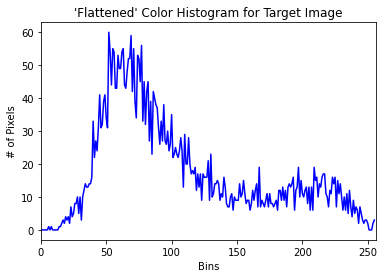

In [ ]:
plt.figure()
plt.title("'Flattened' Color Histogram for Target Image")
plt.xlabel("Bins")
plt.ylabel("# of Pixels")
features = []
chans = cv2.split(image)
hist = cv2.calcHist(chans, [2], hair_source_, [256], [0, 256])
plt.plot(hist, color = "b")
plt.xlim([0, 256])

(0.0, 256.0)

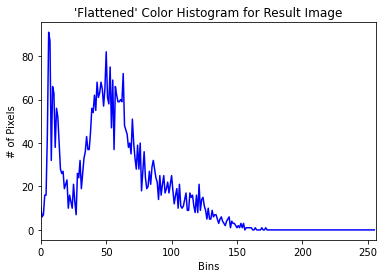

In [ ]:
plt.figure()
plt.title("'Flattened' Color Histogram for Result Image")
plt.xlabel("Bins")
plt.ylabel("# of Pixels")
features = []
chans = cv2.split(result)
hist = cv2.calcHist(chans, [2], hair_result_, [256], [1, 256])
plt.plot(hist, color = "b")
plt.xlim([0, 256])

# Figure 43 lips 39a

## Openface

In [ ]:
cd ..

/content/gdrive/My Drive/FYP


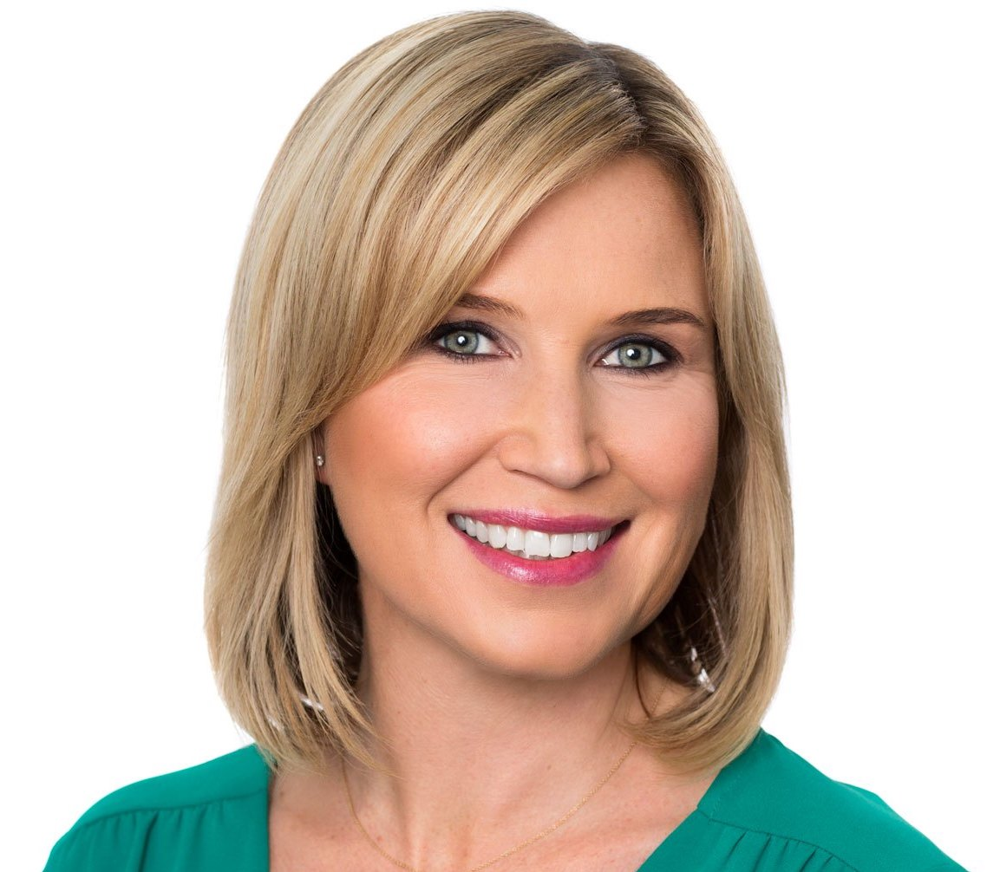

In [ ]:
 import pandas as pd
from google.colab.patches import cv2_imshow
import cv2
from PIL import Image, ImageDraw
import numpy as np
import matplotlib.pyplot as plt
image_path = "original face/image/13.jpg"
image_path_target =  "original face/image/1.jpg"
cv2_imshow(cv2.imread(image_path_target))
og_csv = 'original face OpenFace/girl21.csv'
tg_csv = 'original face OpenFace/17.csv'

## SOURCE LIPS

In [ ]:
# Read CSV
csv_details = pd.read_csv(og_csv, delimiter = ", ")

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  


FileNotFoundError: ignored

In [ ]:
upperlip=""
for i in range(48,55):
  upperlip+=(str(i)+",")
for i in range(60,65):
  upperlip+=(str(i)+",")

upperlip

'48,49,50,51,52,53,54,60,61,62,63,64,'

In [ ]:
bottomlip="48,"

for i in range(54,60):
  bottomlip+=(str(i)+",")
for i in range(64,68):
  bottomlip+=(str(i)+",")

bottomlip

'48,54,55,56,57,58,59,64,65,66,67,'

In [ ]:
#cheeks_list = []
#k = 0
source_upper_lip = ()
for i in [48,49,50,51,52,53,54,64,63,62,61,60,48]:
#for i in [47,13]:
  # csv_details.iloc[0]['face']
  t = (csv_details.iloc[0]["x_"+str(i)], csv_details.iloc[0]["y_"+str(i)])
  t1 = (int(csv_details.iloc[0]["x_"+str(i)]), int(csv_details.iloc[0]["y_"+str(i)]))
  source_upper_lip = source_upper_lip + t1
  ##cheeks_list.append(t)
  #k = k+1

source_upper_lip

(506,
 589,
 558,
 585,
 605,
 590,
 634,
 597,
 666,
 594,
 703,
 595,
 731,
 602,
 720,
 606,
 664,
 609,
 632,
 610,
 603,
 605,
 519,
 594,
 506,
 589)

In [ ]:
#cheeks_list = []
#k = 0
source_bottom_lip = ()
for i in [48,60,67,66,65,64,54,55,56,57,58,59,48]:
#for i in [0,49]:
  # csv_details.iloc[0]['face']
  t = (csv_details.iloc[0]["x_"+str(i)], csv_details.iloc[0]["y_"+str(i)])
  t1 = (int(csv_details.iloc[0]["x_"+str(i)]), int(csv_details.iloc[0]["y_"+str(i)]))
  source_bottom_lip = source_bottom_lip + t1
  #cheeks_list.append(t)
  #k = k+1

#cheeks_list

In [ ]:
import numpy
from PIL import Image, ImageDraw

#################### Upper Lip ####################
# read image as RGB and add alpha (transparency)
im = Image.open(image_path).convert("RGBA")

# convert to numpy (for convenience)
imArray = numpy.asarray(im)

# create mask
polygon = source_upper_lip
maskIm = Image.new('L', (imArray.shape[1], imArray.shape[0]),0)
ImageDraw.Draw(maskIm).polygon(polygon, outline=1, fill=1)
#ImageDraw.Draw(maskIm).chord(source_left_cheek, start=0,end=360,outline=1, fill=1)
mask = numpy.array(maskIm)

# assemble new image (uint8: 0-255)
source_upper_lip_newImArray = numpy.empty(imArray.shape,dtype='uint8')

# colors (three first columns, RGB)
source_upper_lip_newImArray[:,:,:3] = imArray[:,:,:3]

# transparency (4th column)
source_upper_lip_newImArray[:,:,3] = mask*255

#################### Bottom Lip ####################
im = Image.open(image_path).convert("RGBA")

# convert to numpy (for convenience)
imArray = numpy.asarray(im)

# create mask
polygon = source_bottom_lip
maskIm = Image.new('L', (imArray.shape[1], imArray.shape[0]),0)
ImageDraw.Draw(maskIm).polygon(polygon, outline=1, fill=1)
#ImageDraw.Draw(maskIm).chord(source_right_cheek, start=0,end=360,outline=1, fill=1)
mask = numpy.array(maskIm)

# assemble new image (uint8: 0-255)
source_bottom_lip_newImArray = numpy.empty(imArray.shape,dtype='uint8')

# colors (three first columns, RGB)
source_bottom_lip_newImArray[:,:,:3] = imArray[:,:,:3]

# transparency (4th column)
source_bottom_lip_newImArray[:,:,3] = mask*255

In [ ]:
source_upper_lip_newImArray

array([[[ 56,  29,  18,   0],
        [ 66,  38,  26,   0],
        [ 54,  24,  13,   0],
        ...,
        [ 27,  22,  26,   0],
        [ 24,  19,  23,   0],
        [ 36,  34,  39,   0]],

       [[ 78,  51,  34,   0],
        [ 84,  57,  40,   0],
        [ 66,  37,  19,   0],
        ...,
        [ 36,  31,  35,   0],
        [ 34,  29,  33,   0],
        [ 24,  19,  25,   0]],

       [[119,  92,  63,   0],
        [122,  92,  64,   0],
        [ 87,  55,  30,   0],
        ...,
        [ 25,  20,  24,   0],
        [ 26,  21,  25,   0],
        [  3,   0,   4,   0]],

       ...,

       [[220, 160, 124,   0],
        [219, 159, 122,   0],
        [223, 163, 126,   0],
        ...,
        [ 17,   3,   3,   0],
        [ 18,   4,   4,   0],
        [ 19,   5,   5,   0]],

       [[224, 161, 126,   0],
        [220, 158, 121,   0],
        [220, 158, 121,   0],
        ...,
        [ 18,   4,   4,   0],
        [ 20,   6,   6,   0],
        [ 21,   5,   6,   0]],

       [[226

In [ ]:

for x in range(len(source_upper_lip_newImArray)):
  for y in range(len(source_upper_lip_newImArray[0])):
    if (source_upper_lip_newImArray[x,y,3]==0):
      #print("true")
      source_upper_lip_newImArray[x,y,0]=0
      source_upper_lip_newImArray[x,y,1]=0
      source_upper_lip_newImArray[x,y,2]=0
      source_upper_lip_newImArray[x,y,3]=0
   

for x in range(len(source_bottom_lip_newImArray)):
  for y in range(len(source_bottom_lip_newImArray[0])):
    if (source_bottom_lip_newImArray[x,y,3]==0):
      source_bottom_lip_newImArray[x,y,0]=0
      source_bottom_lip_newImArray[x,y,1]=0
      source_bottom_lip_newImArray[x,y,2]=0
      source_bottom_lip_newImArray[x,y,3]=0

In [ ]:
# back to Image from numpy
source_upper_lip_EXT = Image.fromarray(source_upper_lip_newImArray, "RGBA")
# back to Image from numpy
source_bottom_lip_EXT = Image.fromarray(source_bottom_lip_newImArray, "RGBA")
source_upper_lip_EXT_ARRAY = numpy.asarray(source_upper_lip_EXT)
source_bottom_lip_EXT_ARRAY = numpy.asarray(source_bottom_lip_EXT)

## TARGET LIPS

In [ ]:
# Read CSV
csv_details = pd.read_csv(tg_csv, delimiter = ", ")

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  


In [ ]:
#cheeks_list = []
#k = 0
target_upper_lip = ()
for i in [48,49,50,51,52,53,54,64,63,62,61,60,48]:
#for i in [47,13]:
  # csv_details.iloc[0]['face']
  t = (csv_details.iloc[0]["x_"+str(i)], csv_details.iloc[0]["y_"+str(i)])
  t1 = (int(csv_details.iloc[0]["x_"+str(i)]), int(csv_details.iloc[0]["y_"+str(i)]))
  target_upper_lip = target_upper_lip + t1
  ##cheeks_list.append(t)
  #k = k+1

target_upper_lip

(315,
 378,
 349,
 373,
 381,
 378,
 401,
 388,
 425,
 392,
 455,
 407,
 479,
 428,
 468,
 426,
 422,
 406,
 398,
 401,
 377,
 393,
 324,
 383,
 315,
 378)

In [ ]:
#cheeks_list = []
#k = 0
target_bottom_lip = ()
for i in [48,60,67,66,65,64,54,55,56,57,58,59,48]:
#for i in [0,49]:
  # csv_details.iloc[0]['face']
  t = (csv_details.iloc[0]["x_"+str(i)], csv_details.iloc[0]["y_"+str(i)])
  t1 = (int(csv_details.iloc[0]["x_"+str(i)]), int(csv_details.iloc[0]["y_"+str(i)]))
  target_bottom_lip = target_bottom_lip + t1
  #cheeks_list.append(t)
  #k = k+1

#cheeks_list

In [ ]:
import numpy
from PIL import Image, ImageDraw

#################### Upper Lip ####################
# read image as RGB and add alpha (transparency)
im = Image.open(image_path_target).convert("RGBA")

# convert to numpy (for convenience)
imArray = numpy.asarray(im)

# create mask
polygon = target_upper_lip
maskIm = Image.new('L', (imArray.shape[1], imArray.shape[0]),0)
ImageDraw.Draw(maskIm).polygon(polygon, outline=1, fill=1)
#ImageDraw.Draw(maskIm).chord(source_left_cheek, start=0,end=360,outline=1, fill=1)
mask = numpy.array(maskIm)

# assemble new image (uint8: 0-255)
target_upper_lip_newImArray = numpy.empty(imArray.shape,dtype='uint8')

# colors (three first columns, RGB)
target_upper_lip_newImArray[:,:,:3] = imArray[:,:,:3]

# transparency (4th column)
target_upper_lip_newImArray[:,:,3] = mask*255

#################### Bottom Lip ####################
im = Image.open(image_path_target).convert("RGBA")

# convert to numpy (for convenience)
imArray = numpy.asarray(im)

# create mask
polygon = target_bottom_lip
maskIm = Image.new('L', (imArray.shape[1], imArray.shape[0]),0)
ImageDraw.Draw(maskIm).polygon(polygon, outline=1, fill=1)
#ImageDraw.Draw(maskIm).chord(source_right_cheek, start=0,end=360,outline=1, fill=1)
mask = numpy.array(maskIm)

# assemble new image (uint8: 0-255)
target_bottom_lip_newImArray = numpy.empty(imArray.shape,dtype='uint8')

# colors (three first columns, RGB)
target_bottom_lip_newImArray[:,:,:3] = imArray[:,:,:3]

# transparency (4th column)
target_bottom_lip_newImArray[:,:,3] = mask*255

In [ ]:

for x in range(len(target_upper_lip_newImArray)):
  for y in range(len(target_upper_lip_newImArray[0])):
    if (target_upper_lip_newImArray[x][y][3]==0):
      target_upper_lip_newImArray[x][y][0]=0
      target_upper_lip_newImArray[x][y][1]=0
      target_upper_lip_newImArray[x][y][2]=0
      target_upper_lip_newImArray[x][y][3]=0
   

for x in range(len(target_bottom_lip_newImArray)):
  for y in range(len(target_bottom_lip_newImArray[0])):
    if (target_bottom_lip_newImArray[x][y][3]==0):
      target_bottom_lip_newImArray[x][y][0]=0
      target_bottom_lip_newImArray[x][y][1]=0
      target_bottom_lip_newImArray[x][y][2]=0
      target_bottom_lip_newImArray[x][y][3]=0

In [ ]:
# back to Image from numpy
target_upper_lip_EXT = Image.fromarray(target_upper_lip_newImArray, "RGBA")
# back to Image from numpy
target_bottom_lip_EXT = Image.fromarray(target_bottom_lip_newImArray, "RGBA")
target_upper_lip_EXT_ARRAY = numpy.asarray(target_upper_lip_EXT)
target_bottom_lip_EXT_ARRAY = numpy.asarray(target_bottom_lip_EXT)

## Result

In [ ]:
im = Image.open("result_lips/1_13_result.jpg").convert("RGBA")


In [ ]:
import numpy
from PIL import Image, ImageDraw

#################### Upper Lip ####################
# read image as RGB and add alpha (transparency)
im = Image.open("result_lips/1_13_result.jpg").convert("RGBA")

# convert to numpy (for convenience)
imArray = numpy.asarray(im)

# create mask
polygon = source_upper_lip
maskIm = Image.new('L', (imArray.shape[1], imArray.shape[0]),0)
ImageDraw.Draw(maskIm).polygon(polygon, outline=1, fill=1)
#ImageDraw.Draw(maskIm).chord(source_left_cheek, start=0,end=360,outline=1, fill=1)
mask = numpy.array(maskIm)

# assemble new image (uint8: 0-255)
result_upper_lip_newImArray = numpy.empty(imArray.shape,dtype='uint8')

# colors (three first columns, RGB)
result_upper_lip_newImArray[:,:,:3] = imArray[:,:,:3]

# transparency (4th column)
result_upper_lip_newImArray[:,:,3] = mask*255

#################### Bottom Lip ####################
im = Image.open("result_lips/1_13_result.jpg").convert("RGBA")

# convert to numpy (for convenience)
imArray = numpy.asarray(im)

# create mask
polygon = source_bottom_lip
maskIm = Image.new('L', (imArray.shape[1], imArray.shape[0]),0)
ImageDraw.Draw(maskIm).polygon(polygon, outline=1, fill=1)
#ImageDraw.Draw(maskIm).chord(source_right_cheek, start=0,end=360,outline=1, fill=1)
mask = numpy.array(maskIm)

# assemble new image (uint8: 0-255)
result_bottom_lip_newImArray = numpy.empty(imArray.shape,dtype='uint8')

# colors (three first columns, RGB)
result_bottom_lip_newImArray[:,:,:3] = imArray[:,:,:3]

# transparency (4th column)
result_bottom_lip_newImArray[:,:,3] = mask*255

In [ ]:

for x in range(len(result_upper_lip_newImArray)):
  for y in range(len(result_upper_lip_newImArray[0])):
    if (result_upper_lip_newImArray[x][y][3]==0):
      result_upper_lip_newImArray[x][y][0]=0
      result_upper_lip_newImArray[x][y][1]=0
      result_upper_lip_newImArray[x][y][2]=0
      result_upper_lip_newImArray[x][y][3]=0
   

for x in range(len(result_bottom_lip_newImArray)):
  for y in range(len(result_bottom_lip_newImArray[0])):
    if (result_bottom_lip_newImArray[x][y][3]==0):
      result_bottom_lip_newImArray[x][y][0]=0
      result_bottom_lip_newImArray[x][y][1]=0
      result_bottom_lip_newImArray[x][y][2]=0
      result_bottom_lip_newImArray[x][y][3]=0

In [ ]:
# back to Image from numpy
result_upper_lip_EXT = Image.fromarray(result_upper_lip_newImArray, "RGBA")
# back to Image from numpy
result_bottom_lip_EXT = Image.fromarray(result_bottom_lip_newImArray, "RGBA")
result_upper_lip_EXT_ARRAY = numpy.asarray(result_upper_lip_EXT)
result_bottom_lip_EXT_ARRAY = numpy.asarray(result_bottom_lip_EXT)

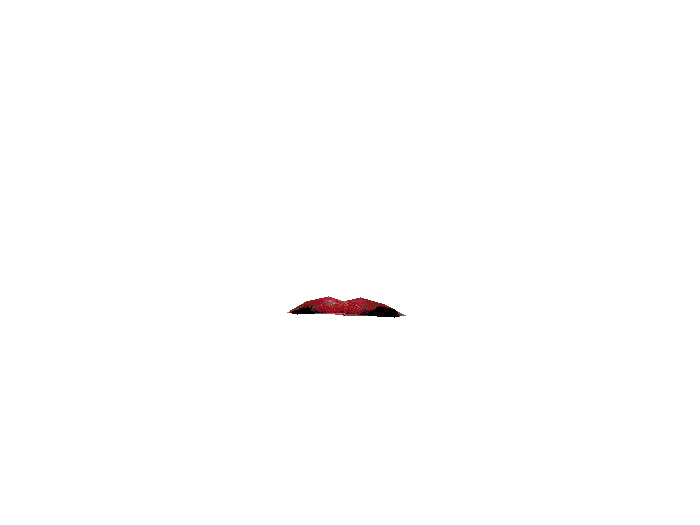

In [ ]:
result_upper_lip_EXT

## Figure 43 LIPS 39a

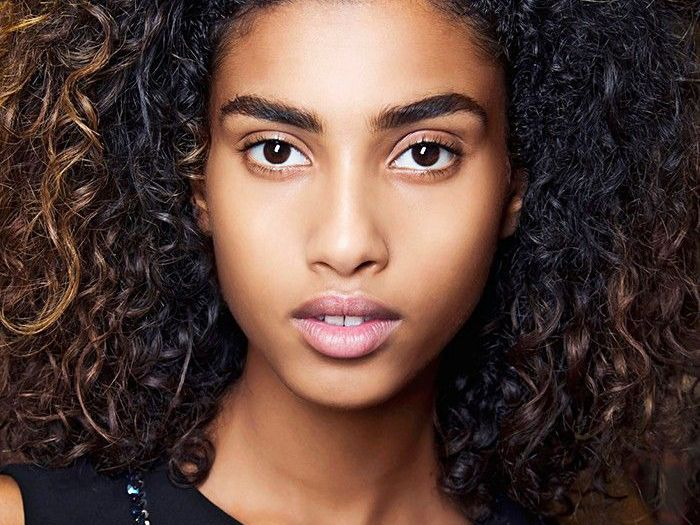

In [ ]:
from matplotlib import pyplot as plt
import numpy as np
import argparse
import cv2
# construct the argument parser and parse the arguments
from google.colab.patches import cv2_imshow
# load the image and show it
image = cv2.imread("original face/image/13.jpg")
source = cv2.imread("original face/image/1.jpg")
result = cv2.imread("result_lips/1_13_result.jpg")
cv2_imshow(image)

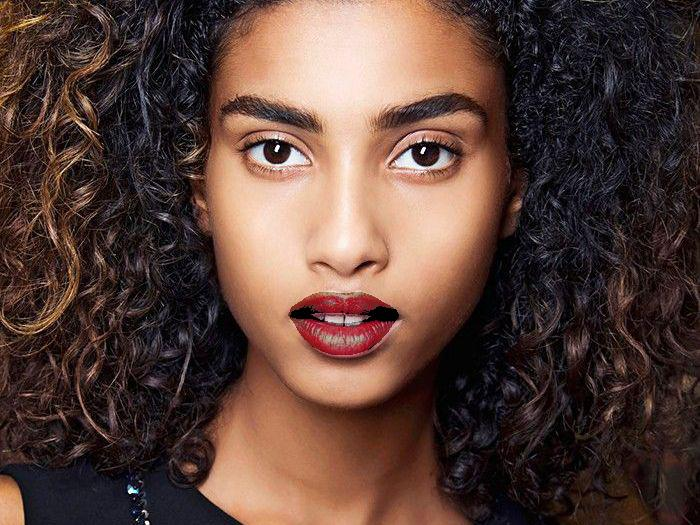

In [ ]:
cv2_imshow(result)

In [ ]:
chans = cv2.split(source)

In [ ]:
source_left = cv2.cvtColor(target_bottom_lip_EXT_ARRAY+target_upper_lip_EXT_ARRAY, cv2.COLOR_BGR2GRAY)

In [ ]:
target_left  = cv2.cvtColor(source_bottom_lip_EXT_ARRAY+source_upper_lip_EXT_ARRAY, cv2.COLOR_BGR2GRAY)

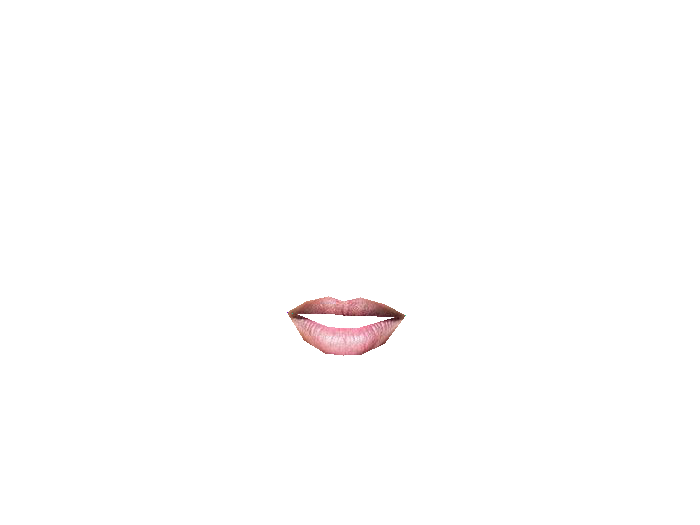

In [ ]:
Image.fromarray((source_bottom_lip_EXT_ARRAY+source_upper_lip_EXT_ARRAY).astype('uint8'))

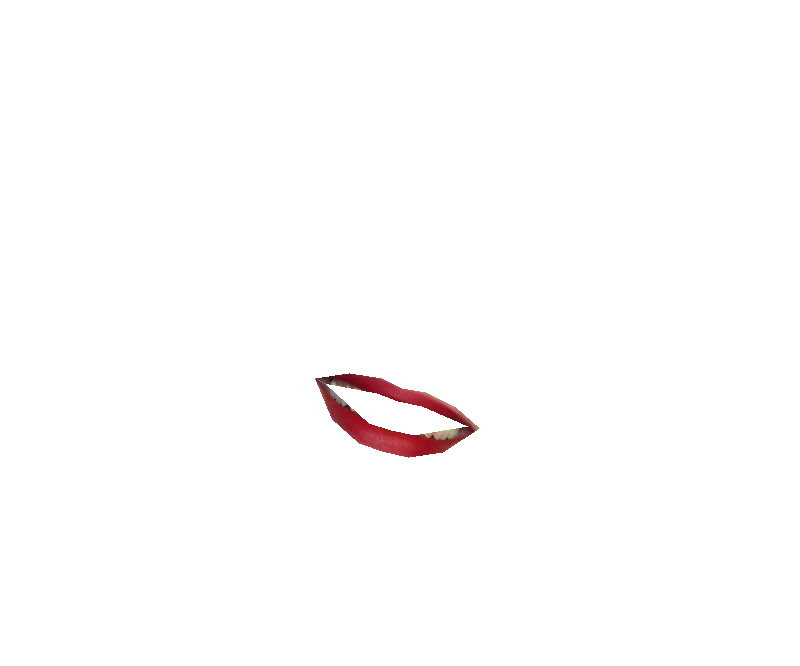

In [ ]:
Image.fromarray((target_bottom_lip_EXT_ARRAY+target_upper_lip_EXT_ARRAY).astype('uint8'))

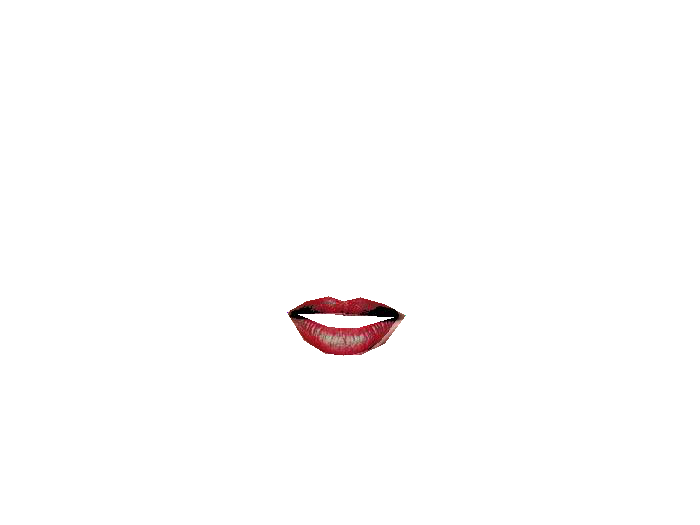

In [ ]:
Image.fromarray((result_bottom_lip_EXT_ARRAY+result_upper_lip_EXT_ARRAY).astype('uint8'))

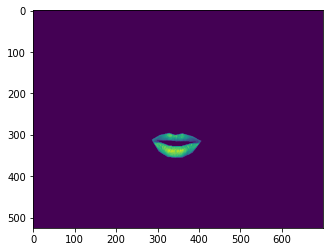

In [ ]:
plt.imshow(target_left)

(0.0, 256.0)

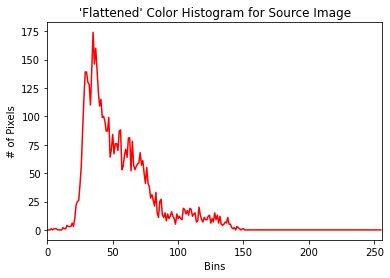

In [ ]:
plt.figure()
plt.title("'Flattened' Color Histogram for Source Image")
plt.xlabel("Bins")
plt.ylabel("# of Pixels")
features = []
chans = cv2.split(source)
hist = cv2.calcHist(chans, [0], source_left, [256], [0, 256])
plt.plot(hist, color = "r")
plt.xlim([0, 256])

(0.0, 256.0)

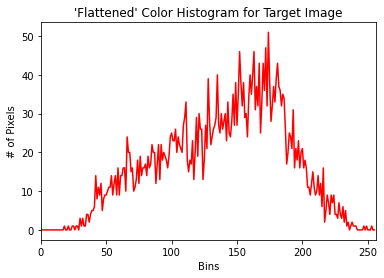

In [ ]:
plt.figure()
plt.title("'Flattened' Color Histogram for Target Image")
plt.xlabel("Bins")
plt.ylabel("# of Pixels")
features = []
chans = cv2.split(image)
hist = cv2.calcHist(chans, [0], target_left, [256], [0, 256])
plt.plot(hist, color = "r")
plt.xlim([0, 256])

(0.0, 256.0)

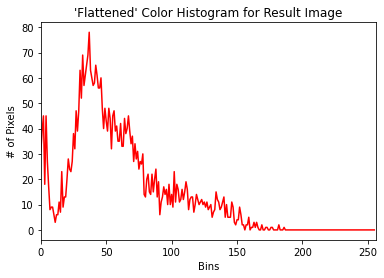

In [ ]:
plt.figure()
plt.title("'Flattened' Color Histogram for Result Image")
plt.xlabel("Bins")
plt.ylabel("# of Pixels")
features = []
chans = cv2.split(result)
hist = cv2.calcHist(chans, [0], target_left, [256], [1, 256])
plt.plot(hist, color = "r")
plt.xlim([0, 256])

(0.0, 256.0)

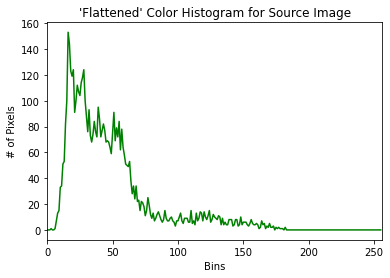

In [ ]:
plt.figure()
plt.title("'Flattened' Color Histogram for Source Image")
plt.xlabel("Bins")
plt.ylabel("# of Pixels")
features = []
chans = cv2.split(source)
hist = cv2.calcHist(chans, [1], source_left, [256], [1, 256])
plt.plot(hist, color = "g")
plt.xlim([0, 256])

(0.0, 256.0)

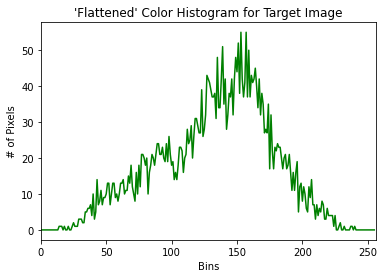

In [ ]:
plt.figure()
plt.title("'Flattened' Color Histogram for Target Image")
plt.xlabel("Bins")
plt.ylabel("# of Pixels")
features = []
chans = cv2.split(image)
hist = cv2.calcHist(chans, [1], target_left, [256], [1, 256])
plt.plot(hist, color = "g")
plt.xlim([0, 256])

(0.0, 256.0)

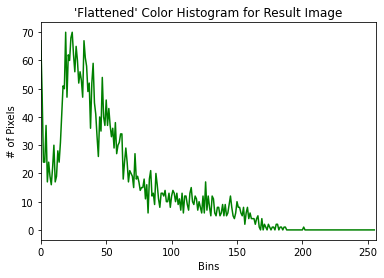

In [ ]:
plt.figure()
plt.title("'Flattened' Color Histogram for Result Image")
plt.xlabel("Bins")
plt.ylabel("# of Pixels")
features = []
chans = cv2.split(result)
hist = cv2.calcHist(chans, [1], target_left, [256], [1, 256])
plt.plot(hist, color = "g")
plt.xlim([0, 256])

(0.0, 256.0)

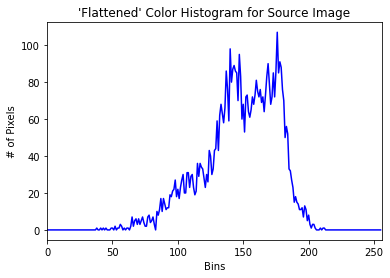

In [ ]:
plt.figure()
plt.title("'Flattened' Color Histogram for Source Image")
plt.xlabel("Bins")
plt.ylabel("# of Pixels")
features = []
chans = cv2.split(source)
hist = cv2.calcHist(chans, [2], source_left, [256], [0, 256])
plt.plot(hist, color = "b")
plt.xlim([0, 256])

(0.0, 256.0)

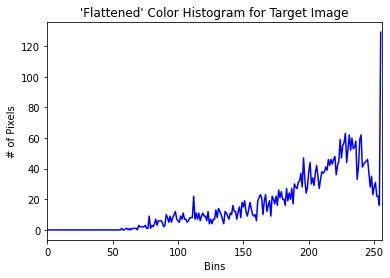

In [ ]:
plt.figure()
plt.title("'Flattened' Color Histogram for Target Image")
plt.xlabel("Bins")
plt.ylabel("# of Pixels")
features = []
chans = cv2.split(image)
hist = cv2.calcHist(chans, [2], target_left, [256], [0, 256])
plt.plot(hist, color = "b")
plt.xlim([0, 256])

(0.0, 256.0)

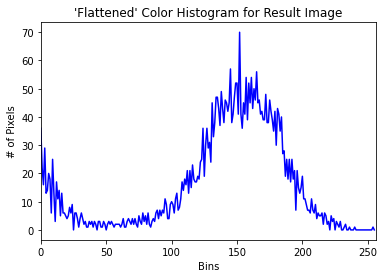

In [ ]:
plt.figure()
plt.title("'Flattened' Color Histogram for Result Image")
plt.xlabel("Bins")
plt.ylabel("# of Pixels")
features = []
chans = cv2.split(result)
hist = cv2.calcHist(chans, [2], target_left, [256], [1, 256])
plt.plot(hist, color = "b")
plt.xlim([0, 256])

## N-dimensional colour transfer


In [ ]:
import os
os.getcwd()

'/content/gdrive/My Drive/FYP'

In [ ]:
from matplotlib import pyplot as plt
import numpy as np
import argparse
import cv2
# construct the argument parser and parse the arguments
from google.colab.patches import cv2_imshow
# load the image and show it
image = cv2.imread('source/s7.jpg')
source = cv2.imread('target/t2.jpg')
result = cv2.imread("result_N_dimensional/result7_opp.jpg")


(0.0, 256.0)

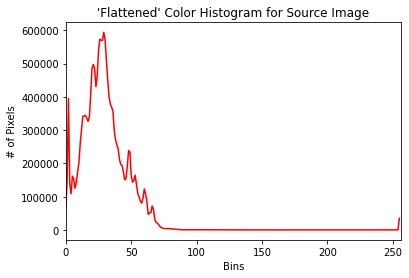

In [ ]:
plt.figure()
plt.title("'Flattened' Color Histogram for Source Image")
plt.xlabel("Bins")
plt.ylabel("# of Pixels")
features = []
chans = cv2.split(source)
hist = cv2.calcHist(chans, [0], None, [256], [0, 256])
plt.plot(hist, color = "r")
plt.xlim([0, 256])

(0.0, 256.0)

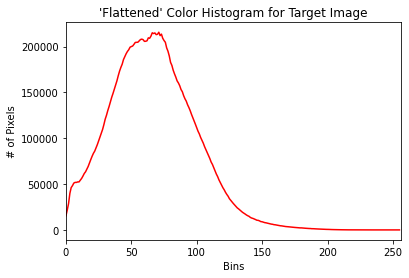

In [ ]:
plt.figure()
plt.title("'Flattened' Color Histogram for Target Image")
plt.xlabel("Bins")
plt.ylabel("# of Pixels")
features = []
chans = cv2.split(image)
hist = cv2.calcHist(chans, [0], None, [256], [1, 256])
plt.plot(hist, color = "r")
plt.xlim([0, 256])

(0.0, 256.0)

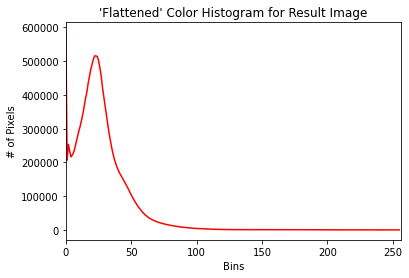

In [ ]:
plt.figure()
plt.title("'Flattened' Color Histogram for Result Image")
plt.xlabel("Bins")
plt.ylabel("# of Pixels")
features = []
chans = cv2.split(result)
hist = cv2.calcHist(chans, [0], None, [256], [0, 256])
plt.plot(hist, color = "r")
plt.xlim([0, 256])

(0.0, 256.0)

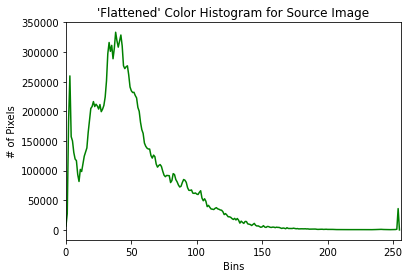

In [ ]:
plt.figure()
plt.title("'Flattened' Color Histogram for Source Image")
plt.xlabel("Bins")
plt.ylabel("# of Pixels")
features = []
chans = cv2.split(source)
hist = cv2.calcHist(chans, [1], None, [256], [1, 256])
plt.plot(hist, color = "g")
plt.xlim([0, 256])

(0.0, 256.0)

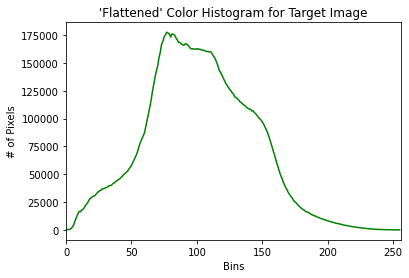

In [ ]:
plt.figure()
plt.title("'Flattened' Color Histogram for Target Image")
plt.xlabel("Bins")
plt.ylabel("# of Pixels")
features = []
chans = cv2.split(image)
hist = cv2.calcHist(chans, [1], None, [256], [1, 256])
plt.plot(hist, color = "g")
plt.xlim([0, 256])

(0.0, 256.0)

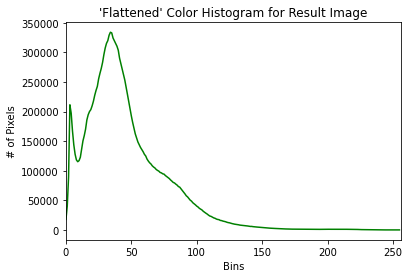

In [ ]:
plt.figure()
plt.title("'Flattened' Color Histogram for Result Image")
plt.xlabel("Bins")
plt.ylabel("# of Pixels")
features = []
chans = cv2.split(result)
hist = cv2.calcHist(chans, [1], None, [256], [1, 256])
plt.plot(hist, color = "g")
plt.xlim([0, 256])

(0.0, 256.0)

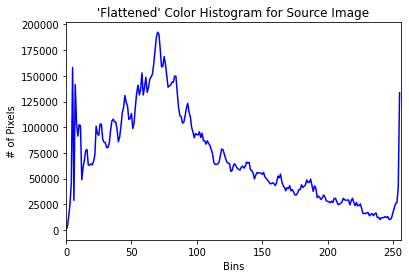

In [ ]:
plt.figure()
plt.title("'Flattened' Color Histogram for Source Image")
plt.xlabel("Bins")
plt.ylabel("# of Pixels")
features = []
chans = cv2.split(source)
hist = cv2.calcHist(chans, [2], None, [256], [0, 256])
plt.plot(hist, color = "b")
plt.xlim([0, 256])

(0.0, 256.0)

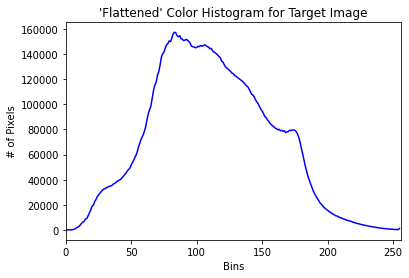

In [ ]:
plt.figure()
plt.title("'Flattened' Color Histogram for Target Image")
plt.xlabel("Bins")
plt.ylabel("# of Pixels")
features = []
chans = cv2.split(image)
hist = cv2.calcHist(chans, [2], None, [256], [0, 256])
plt.plot(hist, color = "b")
plt.xlim([0, 256])

(0.0, 256.0)

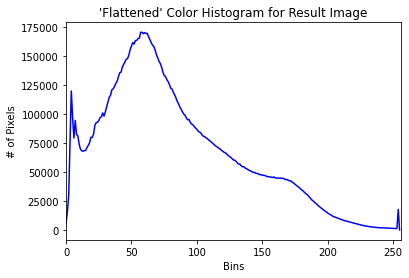

In [ ]:
plt.figure()
plt.title("'Flattened' Color Histogram for Result Image")
plt.xlabel("Bins")
plt.ylabel("# of Pixels")
features = []
chans = cv2.split(result)
hist = cv2.calcHist(chans, [2], None, [256], [1, 256])
plt.plot(hist, color = "b")
plt.xlim([0, 256])